# Project: Wrangling and Analyze Data

## Data Gathering

In [86]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import set_printoptions
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
import warnings
warnings.filterwarnings('ignore')
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, auc, roc_curve, roc_auc_score, mean_squared_error, f1_score, precision_score, recall_score

%matplotlib inline

In [2]:
fileName='prosperLoanData.csv'
filePath='C:/Users/ALABI/Documents/Prognozai/Synthetic data, Data Augmentation, & Compression/dataset/'
data =filePath+fileName
Prosper = pd.read_csv(data)

## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.





In [3]:
Prosper.head(6)

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,...,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,...,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,...,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,...,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,...,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20
5,0F05359734824199381F61D,1074836,2013-12-14 08:26:37.093000000,NaN,60,Current,NaN,0.15425,0.1314,0.1214,...,-25.33,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1


In [4]:
Prosper.describe()

,ListingNumber,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
count,1.139370e+05,113937.000000,113912.000000,113937.000000,113937.000000,84853.000000,84853.000000,84853.000000,84853.000000,84853.000000,...,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000
mean,6.278857e+05,40.830248,0.218828,0.192764,0.182701,0.168661,0.080306,0.096068,4.072243,5.950067,...,-54.725641,-14.242698,700.446342,681.420499,25.142686,0.998584,0.048027,0.023460,16.550751,80.475228
std,3.280762e+05,10.436212,0.080364,0.074818,0.074516,0.068467,0.046764,0.030403,1.673227,2.376501,...,60.675425,109.232758,2388.513831,2357.167068,275.657937,0.017919,0.332353,0.232412,294.545422,103.239020
min,4.000000e+00,12.000000,0.006530,0.000000,-0.010000,-0.182700,0.004900,-0.182700,1.000000,1.000000,...,-664.870000,-9274.750000,-94.200000,-954.550000,0.000000,0.700000,0.000000,0.000000,0.000000,1.000000
25%,4.009190e+05,36.000000,0.156290,0.134000,0.124200,0.115670,0.042400,0.074080,3.000000,4.000000,...,-73.180000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000
50%,6.005540e+05,36.000000,0.209760,0.184000,0.173000,0.161500,0.072400,0.091700,4.000000,6.000000,...,-34.440000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,44.000000
75%,8.926340e+05,36.000000,0.283810,0.250000,0.240000,0.224300,0.112000,0.116600,5.000000,8.000000,...,-13.920000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,115.000000
max,1.255725e+06,60.000000,0.512290,0.497500,0.492500,0.319900,0.366000,0.283700,7.000000,11.000000,...,32.060000,0.000000,25000.000000,25000.000000,21117.900000,1.012500,39.000000,33.000000,25000.000000,1189.000000




### Quality issues
1. Missing values in some of the columns like CreditGrade, ClosedDate, ClosedDate

2. Issues with column names like ProsperRating (numeric), ProsperRating (Alpha), ListingCategory (numeric). 

3. The Term column is a numerical instead of categorcical
 
4. ProsperScore rating has a risk score of 11.

5. Too many PastDues in the LoanStatus Column

6. Wrong Data types for some of the colummns in the data.

### Tidiness issues
 7. Two variables in one column - LoanOriginatorQuarter.

## Cleaning Data

In [5]:
# Make copies of original pieces of data
Prosper_Clean = Prosper.copy()
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
Prosper_Clean.head()

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,GroupKey,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,LoanKey,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MemberKey,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,NaN,NaN,NaN,NaN,NaN,NaN,0,CO,Other,Self-employed,2.0,True,True,NaN,2007-08-26 18:41:46.780000000,640.0,659.0,2001-10-11 00:00:00,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,"$25,000-49,999",True,3083.333333,E33A3400205839220442E84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,78,19141,9425,2007-09-12 00:00:00,Q3 2007,1F3E3376408759268057EDA,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,0.07960,0.0249,0.05470,6.0,A,7.0,2,CO,Professional,Employed,44.0,False,False,NaN,2014-02-27 08:28:14,680.0,699.0,1996-03-18 00:00:00,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,"$50,000-74,999",True,6125.000000,9E3B37071505919926B1D82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0,134815,10000,2014-03-03 00:00:00,Q1 2014,1D13370546739025387B2F4,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,NaN,NaN,NaN,NaN,NaN,NaN,0,GA,Other,Not available,NaN,False,True,783C3371218786870A73D20,2007-01-02 14:09:10.060000000,480.0,499.0,2002-07-27 00:00:00,NaN,NaN,3.0,0,0.0,0.0,1.0,1.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,Not displayed,True,2083.333333,6954337960046817851BCB2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,86,6466,3001,2007-01-17 00:00:00,Q1 2007,5F7033715035555618FA612,123.32,4186.63,3001.00,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,0.08490,0.0249,0.06000,6.0,A,9.0,16,GA,Skilled Labor,Employed,113.0,True,False,NaN,2012-10-22 11:02:32,800.0,819.0,1983-02-28 00:00:00,5.0,5.0,29.0,7,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,"$25,000-49,999",True,2875.000000,A0393664465886295619C51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,16,77296,10000,2012-11-01 00:00:00,Q4 2012,9ADE356069835475068C6D2,321.45,5143.20,4091.09,1052.11,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,0.18316,0.0925,0.09066,3.0,D,4.0,2,MN

### Issue #1: Issues with column names

#### Define:
Change the following columns ProsperRating (numeric), ProsperRating (Alpha), ListingCategory (numeric), TradesNeverDelinquent (Percentage) to;
1. ProsperRatingNumeric
2. ProsperRatingAlpha
3. ListingCategoryNumeric
4. TradesNeverDelinquentPercent


#### Code

In [6]:
Prosper_Clean.rename(columns = {'ProsperRating (numeric)':'ProsperRatingNumeric', 'ProsperRating (Alpha)':'ProsperRatingAlpha',
                               'ListingCategory (numeric)':'ListingCategoryNumeric', 
                                'TradesNeverDelinquent (Percentage)':'TradesNeverDelinquentPercent'}, inplace=True)

#### Test

In [7]:
ColNameWithIssue = ['ProsperRating (numeric)', 'ProsperRating (Alpha)', 'ListingCategory (numeric)']
for col in ColNameWithIssue:
    assert(col not in Prosper_Clean.columns.tolist())

### Issue #2:  The Term column is a numerical instead of categorcical

#### Define:
Convert 12, 36, and 60 to short, medium and long term

#### Code

In [8]:
Term_dict = {12 : 'ShortTerm', 36 : 'MediumTerm', 60 : 'LongTerm'}
Prosper_Clean['Term'] = Prosper_Clean['Term'].map(Term_dict)


#### Test


In [9]:
Prosper_Clean['Term'].value_counts()

MediumTerm    87778
LongTerm      24545
ShortTerm      1614
Name: Term, dtype: int64



### Issue #3: ProsperScore rating has a risk score of 11.

#### Define: Change riskscore with 11 to 10

In [10]:
Prosper_Clean['ProsperScore'].value_counts()

4.0     12595
6.0     12278
8.0     12053
7.0     10597
5.0      9813
3.0      7642
9.0      6911
2.0      5766
10.0     4750
11.0     1456
1.0       992
Name: ProsperScore, dtype: int64

#### Code


In [11]:
Prosper_Clean['ProsperScore'] = Prosper_Clean['ProsperScore'].replace([11], 10)

#### Test

In [12]:
Prosper_Clean['ProsperScore'].value_counts()

4.0     12595
6.0     12278
8.0     12053
7.0     10597
5.0      9813
3.0      7642
9.0      6911
10.0     6206
2.0      5766
1.0       992
Name: ProsperScore, dtype: int64

### Issue #4: Too many PastDues in the LoanStatus Column


#### Define: Collapse all the pastdues category into one

#### Code

In [13]:
Status_dict = {'Current' : 'Current', 'Completed' : 'Completed', 'Chargedoff' : 'Chargedoff', 'Defaulted' : 'Defaulted', 
               'Past Due (1-15 days)': 'Past Due', 'Past Due (31-60 days)' : 'Past Due', 
               'Past Due (61-90 days)' : 'Past Due', 'Past Due (91-120 days)' : 'Past Due', 
               'Past Due (16-30 days)' : 'Past Due', 'FinalPaymentInProgress' : 'FinalPaymentInProgress', 
               'Past Due (>120 days)' : 'Past Due', 'Cancelled' : 'Cancelled'}
Prosper_Clean['LoanStatus'] = Prosper_Clean['LoanStatus'].map(Status_dict)




In [16]:
Prosper_Clean['ProsperRatingAlpha'].value_counts()

C     18345
B     15581
A     14551
D     14274
E      9795
HR     6935
AA     5372
Name: ProsperRatingAlpha, dtype: int64

In [17]:
ordinal_var_dict = {'CreditGrade': ['A', 'AA', 'B', 'C', 'D', 'E', 'HR', 'NC', 'None'],
                    'ProsperRatingAlpha': ['A', 'AA', 'B', 'C', 'D', 'E', 'HR', 'None'], 
                    'EmploymentStatus': ['Employed', 'Full-time', 'Not available', 'Not employed', 'Other', 'Part-time', 'Retired','Self-employed'], 
                   #'IncomeRange': ['$0', '$1-24,999', '$25,000-49,999', '$50,000-74,999', '$75,000-99,999', '$100,000+', 'Not displayed', 'Not employed'],
                'LoanStatus': ['Cancelled', 'Chargedoff', 'Completed', 'Current', 'Defaulted', 'FinalPaymentInProgress', 'Past Due'],
                    'Term' : ['ShortTerm', 'MediumTerm', 'LongTerm']}
#convert into ordered categorical types
for var in ordinal_var_dict:
    ordered_var = pd.api.types.CategoricalDtype(ordered = True,
                                                categories = ordinal_var_dict[var])
    Prosper_Clean[var] = Prosper_Clean[var].astype(ordered_var)
 

In [18]:
# Note that we now have some column whose datatype is category
Prosper_Clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype   
---  ------                               --------------   -----   
 0   ListingKey                           113937 non-null  object  
 1   ListingNumber                        113937 non-null  int64   
 2   ListingCreationDate                  113937 non-null  object  
 3   CreditGrade                          28953 non-null   category
 4   Term                                 113937 non-null  category
 5   LoanStatus                           113937 non-null  category
 6   ClosedDate                           55089 non-null   object  
 7   BorrowerAPR                          113912 non-null  float64 
 8   BorrowerRate                         113937 non-null  float64 
 9   LenderYield                          113937 non-null  float64 
 10  EstimatedEffectiveYield              84853 non-null   float64 
 11  

### Issue #6: Missing values in columns

#### Define
1. Replace the CreditGrade columns with None
2. Replace columns whose values are missing as a result of the data schema with 0
3. Replace columns whose values are missing as a result of incomplete data(Numeric) with the median value

#### Code

In [19]:
# Credit Grade:  The Credit rating that was assigned at the time the listing went live. 
#Applicable for listings pre-2009 period and will only be populated for those listings.
# In this particular column, we replace the nan values with None
Prosper_Clean['CreditGrade'].fillna('None', inplace=True)

In [20]:
#List 1 contains columns whose values are missing as a result of the data schema 
ColSchema = ['EstimatedEffectiveYield','DebtToIncomeRatio', 'EstimatedLoss', 
                  'ClosedDate','EstimatedReturn', 'ProsperRatingNumeric', 
                  'ProsperScore', 'TotalProsperLoans', 'TotalProsperPaymentsBilled', 'OnTimeProsperPayments', 
                  'ProsperPaymentsLessThanOneMonthLate', 'ProsperPaymentsOneMonthPlusLate', 'ProsperPrincipalBorrowed', 
                  'ProsperPrincipalOutstanding', 'ScorexChangeAtTimeOfListing', 'LoanFirstDefaultedCycleNumber', 'GroupKey', 'FirstRecordedCreditLine']

#List 2 contains columns whose values are missing as a result of incomplete data(Numeric)
ColMissingVals = ['BorrowerAPR', 'CreditScoreRangeLower', 'CreditScoreRangeUpper', 'TotalCreditLinespast7years', 'TotalInquiries',
            'CurrentDelinquencies', 'AmountDelinquent', 'DelinquenciesLast7Years', 'PublicRecordsLast10Years',
            'PublicRecordsLast12Months', 'RevolvingCreditBalance', 'BankcardUtilization', 'AvailableBankcardCredit',
            'TotalTrades','TradesNeverDelinquent (percentage)', 'TradesOpenedLast6Months',
            'EmploymentStatusDuration', 'CurrentCreditLines', 'OpenCreditLines', 'InquiriesLast6Months', 'EmploymentStatusDuration']


# list 3 contains columns whose values are missing as a result of incomplete data(Non-numeric)
ColMissingValsNonnumeric = ['BorrowerState', 'Occupation', 'EmploymentStatus']

In [21]:
# 1. Missing values owing to the data schmema
def variable_schema(col_list):
    for var in col_list:
        Prosper_Clean[var].fillna(0, inplace=True)
    

#2. Missing values owing to incomplete data(Numeric)    
def variable_missing(col_list):
    for var in col_list:
        Prosper_Clean[var].fillna(Prosper_Clean[var].median(), inplace=True)
      #We are making use of the mean value in this case because 
      #majority of the variables in the dataset are not normally distribted.
        
#3. Missing values owing to incomplete data(Non-Numeric)  

def variable_missing2(col_list):
    for var in col_list:
         Prosper_Clean[var].fillna(method='bfill', inplace=True)

In [22]:
variable_schema(ColSchema)
variable_missing(ColMissingVals)
variable_missing2(ColMissingValsNonnumeric)

In [23]:
Prosper_Clean['ProsperRatingAlpha'].fillna('None', inplace=True)

### Issue #7: Two variables in one column - LoanOriginatorQuarter.

#### Define: Split the Loan Origination column to two - LoanOriginationQuarter, LoanOriginatorYear

#### Code

In [24]:
Prosper_Clean[['LoanOriginationQuarter', 'LoanOriginationYear']] = Prosper_Clean['LoanOriginationQuarter'].str.split(expand = True)

#### Test

In [25]:
Prosper_CleanCol = Prosper_Clean.columns.tolist()
assert('LoanOriginationQuarter' in Prosper_CleanCol)
assert('LoanOriginationYear' in Prosper_CleanCol)

In [26]:
# Data analytics team please try to draw a lot of insight from this data. 
# This could be done by asking some set of questions about the data and answering them with visualization.


## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

### Insights:
1.

2.

3.

### Visualization

In [27]:
Prosper_Clean['IncomeRange'] = Prosper_Clean['IncomeRange'].replace(['$0', '$1-24,999', '$25,000-49,999', '$50,000-74,999',
                                                                     '$75,000-99,999','$100,000+', 'Not displayed', 
                                                                     'Not employed'], [0, 1, 2, 3, 4, 5, 6, 7])

In [28]:
Prosper_Clean['IncomeRange'].value_counts()

2    32192
3    31050
5    17337
4    16916
6     7741
1     7274
7      806
0      621
Name: IncomeRange, dtype: int64

## Model Building

> I suggest we split the data into
> 1. The dataset that contains all the catgories in the LoanStatus column except Current
> 2. The datset that contains only the current category in the Loan Status Column

In [29]:
Prosper_Clean['CreditGrade'].value_counts()

None    84984
C        5649
D        5153
B        4389
AA       3509
HR       3508
A        3315
E        3289
NC        141
Name: CreditGrade, dtype: int64

In [30]:
Prosper_Clean['IsBorrowerHomeowner'].value_counts()

True     57478
False    56459
Name: IsBorrowerHomeowner, dtype: int64

In [31]:
Prosper_Clean['Occupation'].value_counts()

Other                                 29521
Professional                          14089
Computer Programmer                    4610
Executive                              4459
Teacher                                3877
Administrative Assistant               3819
Analyst                                3718
Sales - Commission                     3556
Accountant/CPA                         3335
Clerical                               3277
Sales - Retail                         2888
Skilled Labor                          2840
Retail Management                      2692
Nurse (RN)                             2571
Construction                           1846
Truck Driver                           1739
Laborer                                1647
Police Officer/Correction Officer      1618
Civil Service                          1500
Engineer - Mechanical                  1458
Military Enlisted                      1325
Food Service Management                1285
Food Service                    

In [32]:
Prosper_Clean['CurrentlyInGroup'].value_counts()

False    101218
True      12719
Name: CurrentlyInGroup, dtype: int64

In [33]:
Prosper_Clean['IncomeVerifiable'].value_counts()

True     105268
False      8669
Name: IncomeVerifiable, dtype: int64

In [34]:
Prosper_Clean['LoanOriginationQuarter'].value_counts()

Q4    31386
Q1    29678
Q3    27967
Q2    24906
Name: LoanOriginationQuarter, dtype: int64

In [35]:
Prosper_Clean['Term'].value_counts()

MediumTerm    87778
LongTerm      24545
ShortTerm      1614
Name: Term, dtype: int64

In [36]:
Prosper_Clean['LoanStatus'].value_counts()

Current                   56576
Completed                 38074
Chargedoff                11992
Defaulted                  5018
Past Due                   2067
FinalPaymentInProgress      205
Cancelled                     5
Name: LoanStatus, dtype: int64

In [37]:
Prosper_Clean['LoanStatus'].nunique()

7

In [38]:
Prosper_Clean['ProsperRatingAlpha'].value_counts()

None    29084
C       18345
B       15581
A       14551
D       14274
E        9795
HR       6935
AA       5372
Name: ProsperRatingAlpha, dtype: int64

In [39]:
Prosper_Clean['EmploymentStatus'].value_counts()

Employed         68696
Full-time        26889
Self-employed     6255
Not available     5450
Other             3877
Part-time         1114
Not employed       848
Retired            808
Name: EmploymentStatus, dtype: int64

In [40]:
Prosper_Clean['IncomeVerifiable'].value_counts()

True     105268
False      8669
Name: IncomeVerifiable, dtype: int64

In [41]:
Prosper_Clean['BorrowerState'].value_counts()

CA    15457
TX     7191
NY     7112
FL     7047
IL     6190
GA     5265
OH     4418
MI     3770
VA     3447
NJ     3241
NC     3230
WA     3203
PA     3138
MD     2976
MO     2759
MN     2458
MA     2374
CO     2318
IN     2166
AZ     1994
WI     1929
OR     1897
TN     1815
AL     1746
CT     1713
SC     1170
NV     1152
KS     1120
KY     1032
OK     1025
LA     1009
UT      916
AR      899
MS      820
NE      707
ID      640
NH      578
NM      493
RI      463
HI      434
WV      417
DC      399
MT      349
DE      318
VT      214
AK      210
SD      199
IA      196
WY      157
ME      111
ND       55
Name: BorrowerState, dtype: int64

In [42]:
Prosper_Clean['EmploymentStatus'].value_counts()

Employed         68696
Full-time        26889
Self-employed     6255
Not available     5450
Other             3877
Part-time         1114
Not employed       848
Retired            808
Name: EmploymentStatus, dtype: int64

## The Rationale
> Our goal is to build a model to predict if a Loan will end up as completed, Default, ChargedOff or PastDue. Thus we split the data into owing two to the fact that some of the categories in the Loan Status column is current. The idea is to then use what we have learnt from the ProsperNonCurrent dataframe to predict if a loan with current status will end up as completed, default, Past Due, or chargedoff.

In [43]:
NonNumericalCol = ['CreditGrade', 'IsBorrowerHomeowner', 'CurrentlyInGroup', 'IncomeVerifiable', 'LoanOriginationQuarter', 
                   'Term', 'LoanStatus', 'ProsperRatingAlpha','BorrowerState', 'Occupation', 'EmploymentStatus']

In [44]:
Prosper_Clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 82 columns):
 #   Column                               Non-Null Count   Dtype   
---  ------                               --------------   -----   
 0   ListingKey                           113937 non-null  object  
 1   ListingNumber                        113937 non-null  int64   
 2   ListingCreationDate                  113937 non-null  object  
 3   CreditGrade                          113937 non-null  category
 4   Term                                 113937 non-null  category
 5   LoanStatus                           113937 non-null  category
 6   ClosedDate                           113937 non-null  object  
 7   BorrowerAPR                          113937 non-null  float64 
 8   BorrowerRate                         113937 non-null  float64 
 9   LenderYield                          113937 non-null  float64 
 10  EstimatedEffectiveYield              113937 non-null  float64 
 11  

In [45]:
def transform(var_col):
    label_encoder = preprocessing.LabelEncoder()
    for col in var_col:
        Prosper_Clean[col] = label_encoder.fit_transform(Prosper_Clean[col])


In [46]:
transform(NonNumericalCol)

In [47]:
unnecessaryColumns = ['ListingKey', 'ListingNumber', 'ListingCreationDate','DateCreditPulled','FirstRecordedCreditLine', 
                      'LoanKey','ClosedDate','LoanOriginationDate', 'MemberKey', 'BorrowerState','GroupKey','ProsperRatingAlpha',
                      'LoanOriginationQuarter', 'LoanOriginationYear']
# Dates and ID's unecessary 
# ProsperRating (Alpha) is a duplicate of prosperRating (Numeric)
# Member key is duplicate of API key
# EmploymentStatus is a duplicate of Occupation
# InquiriesLast6Months is duplicate of TotalInquires

In [48]:
Prosper_Clean.drop(columns = unnecessaryColumns, inplace = True)

In [49]:
Prosper_Clean.shape

(113937, 68)

In [50]:
Prosper_Clean.head()

,CreditGrade,Term,LoanStatus,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,3,1,2,0.16516,0.1580,0.1380,0.00000,0.0000,0.00000,0.0,0.0,0,35,7,2.0,1,1,640.0,659.0,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,2,1,3083.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,78,19141,9425,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,8,1,3,0.12016,0.0920,0.0820,0.07960,0.0249,0.05470,6.0,7.0,2,41,0,44.0,0,0,680.0,699.0,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,3,1,6125.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,134815,10000,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,6,1,2,0.28269,0.2750,0.2400,0.00000,0.0000,0.00000,0.0,0.0,0,35,2,67.0,0,1,480.0,499.0,10.0,9.0,3.0,0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,8549.0,0.60,4100.0,22.0,0.94,0.0,0.06,6,1,2083.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,86,6466,3001,123.32,4186.63,3001.00,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,8,1,3,0.12528,0.0974,0.0874,0.08490,0.0249,0.06000,6.0,9.0,16,50,0,113.0,1,0,800.0,819.0,5.0,5.0,29.0,7,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,2,1,2875.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,16,77296,10000,321.45,5143.20,4091.09,1052.11,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,8,1,3,0.24614,0.2085,0.1985,0.18316,0.0925,0.09066,3.0,4.0,2,19,0,44.0,1,0,680.0,699.0,19.0,19.0,49.0,6,220.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,6193.0,0.81,695.0,39.0,0.95,2.0,0.26,5,1,9583.333333,1.0,11.0,11.0,0.0,0.0,11000.0,9947.9,0.0,0,0.0,6,102670,15000,563.97,2819.85,1563.22,1256.63,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20


In [51]:
Prosper_Clean['CreditGrade'].value_counts()

8    84984
3     5649
4     5153
2     4389
1     3509
6     3508
0     3315
5     3289
7      141
Name: CreditGrade, dtype: int64

In [52]:
Prosper_Clean['Term'].value_counts()

1    87778
0    24545
2     1614
Name: Term, dtype: int64

In [53]:
Prosper_Clean['LoanStatus'].value_counts()

3    56576
2    38074
1    11992
4     5018
6     2067
5      205
0        5
Name: LoanStatus, dtype: int64

In [54]:
Prosper_Clean['LoanStatus'].nunique()

7

In [55]:
Prosper_Clean['CurrentlyInGroup'].value_counts()

0    101218
1     12719
Name: CurrentlyInGroup, dtype: int64

In [56]:
Prosper_Clean['IncomeVerifiable'].value_counts()

1    105268
0      8669
Name: IncomeVerifiable, dtype: int64

In [57]:
Prosper_Clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 68 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   CreditGrade                          113937 non-null  int32  
 1   Term                                 113937 non-null  int32  
 2   LoanStatus                           113937 non-null  int32  
 3   BorrowerAPR                          113937 non-null  float64
 4   BorrowerRate                         113937 non-null  float64
 5   LenderYield                          113937 non-null  float64
 6   EstimatedEffectiveYield              113937 non-null  float64
 7   EstimatedLoss                        113937 non-null  float64
 8   EstimatedReturn                      113937 non-null  float64
 9   ProsperRatingNumeric                 113937 non-null  float64
 10  ProsperScore                         113937 non-null  float64
 11  ListingCatego

In [58]:
shiftLoanStatus = Prosper_Clean.pop('LoanStatus')
Prosper_Clean.insert(0, 'LoanStatus', shiftLoanStatus)

In [59]:
Prosper_Clean.head()

,LoanStatus,CreditGrade,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,2,3,1,0.16516,0.1580,0.1380,0.00000,0.0000,0.00000,0.0,0.0,0,35,7,2.0,1,1,640.0,659.0,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,2,1,3083.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,78,19141,9425,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,3,8,1,0.12016,0.0920,0.0820,0.07960,0.0249,0.05470,6.0,7.0,2,41,0,44.0,0,0,680.0,699.0,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,3,1,6125.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,134815,10000,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,2,6,1,0.28269,0.2750,0.2400,0.00000,0.0000,0.00000,0.0,0.0,0,35,2,67.0,0,1,480.0,499.0,10.0,9.0,3.0,0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,8549.0,0.60,4100.0,22.0,0.94,0.0,0.06,6,1,2083.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,86,6466,3001,123.32,4186.63,3001.00,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,3,8,1,0.12528,0.0974,0.0874,0.08490,0.0249,0.06000,6.0,9.0,16,50,0,113.0,1,0,800.0,819.0,5.0,5.0,29.0,7,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,2,1,2875.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,16,77296,10000,321.45,5143.20,4091.09,1052.11,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,3,8,1,0.24614,0.2085,0.1985,0.18316,0.0925,0.09066,3.0,4.0,2,19,0,44.0,1,0,680.0,699.0,19.0,19.0,49.0,6,220.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,6193.0,0.81,695.0,39.0,0.95,2.0,0.26,5,1,9583.333333,1.0,11.0,11.0,0.0,0.0,11000.0,9947.9,0.0,0,0.0,6,102670,15000,563.97,2819.85,1563.22,1256.63,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20


In [60]:
Prosper_Clean.describe().T

,count,mean,std,min,25%,50%,75%,max
LoanStatus,113937.0,2.557264,0.879813,0.00000,2.000000,3.000000,3.0000,6.000000e+00
CreditGrade,113937.0,6.742305,2.350215,0.00000,6.000000,8.000000,8.0000,8.000000e+00
Term,113937.0,0.798740,0.434842,0.00000,1.000000,1.000000,1.0000,2.000000e+00
BorrowerAPR,113937.0,0.218826,0.080355,0.00653,0.156290,0.209760,0.2837,5.122900e-01
BorrowerRate,113937.0,0.192764,0.074818,0.00000,0.134000,0.184000,0.2500,4.975000e-01
LenderYield,113937.0,0.182701,0.074516,-0.01000,0.124200,0.173000,0.2400,4.925000e-01
EstimatedEffectiveYield,113937.0,0.125608,0.094335,-0.18270,0.000000,0.131440,0.1952,3.199000e-01
EstimatedLoss,113937.0,0.059807,0.053428,0.00000,0.000000,0.052400,0.0975,3.660000e-01
EstimatedReturn,113937.0,0.071546,0.049426,-0.18270,0.000000,0.079900,0.1087,2.837000e-01
ProsperRatingNumeric,113937.0,3.032746,2.288576,0.00000,0.000000,3.000000,5.0000,7.000000e+00


In [61]:
Prosper_Clean['LoanStatus'].value_counts()

3    56576
2    38074
1    11992
4     5018
6     2067
5      205
0        5
Name: LoanStatus, dtype: int64

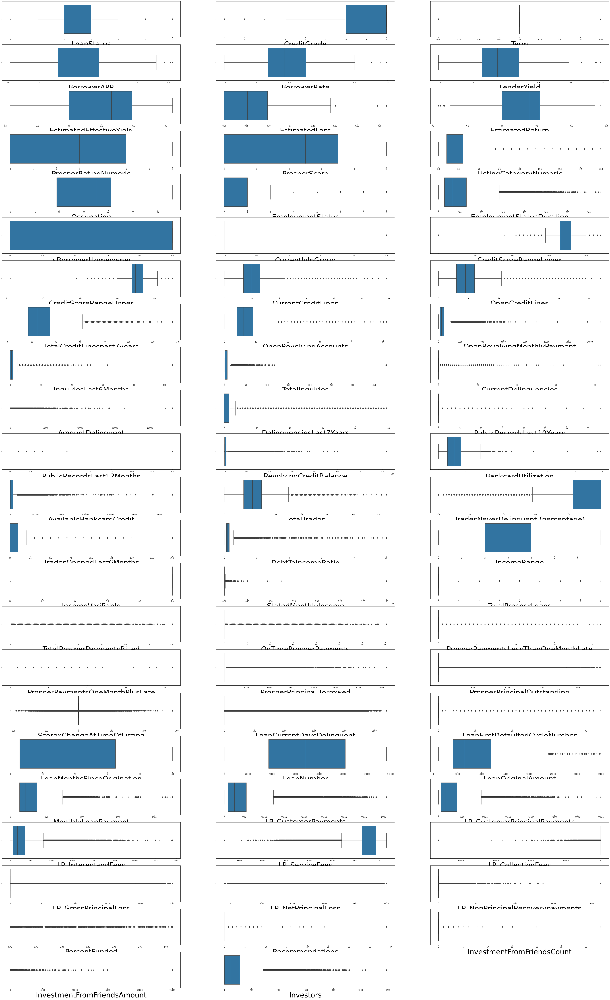

In [62]:
#checking for outliers in the data
plt.figure(figsize=(60,100))
for i in range(len(Prosper_Clean.columns)):
    plt.subplot(23,3,i+1)
    sns.boxplot(x=Prosper_Clean.iloc[ : , i])
    plt.xlabel(Prosper_Clean.columns[i], size= 39)

In [63]:
# The boxplot shows that the data has a lot of outliers and also needs to be tranformed

In [64]:
xProsper_Clean = Prosper_Clean.iloc[:,1:]
yProsper_Clean = Prosper_Clean.iloc[:,0]

yProsper_Clean.head(10)

0    2
1    3
2    2
3    3
4    3
5    3
6    3
7    3
8    3
9    3
Name: LoanStatus, dtype: int32

In [65]:
xProsper_Clean.head(5)

,CreditGrade,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,3,1,0.16516,0.1580,0.1380,0.00000,0.0000,0.00000,0.0,0.0,0,35,7,2.0,1,1,640.0,659.0,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,2,1,3083.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,78,19141,9425,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,8,1,0.12016,0.0920,0.0820,0.07960,0.0249,0.05470,6.0,7.0,2,41,0,44.0,0,0,680.0,699.0,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,3,1,6125.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0,134815,10000,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,6,1,0.28269,0.2750,0.2400,0.00000,0.0000,0.00000,0.0,0.0,0,35,2,67.0,0,1,480.0,499.0,10.0,9.0,3.0,0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,8549.0,0.60,4100.0,22.0,0.94,0.0,0.06,6,1,2083.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,86,6466,3001,123.32,4186.63,3001.00,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,8,1,0.12528,0.0974,0.0874,0.08490,0.0249,0.06000,6.0,9.0,16,50,0,113.0,1,0,800.0,819.0,5.0,5.0,29.0,7,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,2,1,2875.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,16,77296,10000,321.45,5143.20,4091.09,1052.11,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,8,1,0.24614,0.2085,0.1985,0.18316,0.0925,0.09066,3.0,4.0,2,19,0,44.0,1,0,680.0,699.0,19.0,19.0,49.0,6,220.0,1.0,9.0,0.0,0.0,0.0,0.0,0.0,6193.0,0.81,695.0,39.0,0.95,2.0,0.26,5,1,9583.333333,1.0,11.0,11.0,0.0,0.0,11000.0,9947.9,0.0,0,0.0,6,102670,15000,563.97,2819.85,1563.22,1256.63,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20


In [68]:
#to continue cleaning the data for it to be well behave.Rescaling of the data (range 0 : 1)

dataframe=Prosper_Clean
array=dataframe.values

#separate array into input and output components
x = array[:,1:]
y = array[:,0]
scaler= MinMaxScaler(feature_range=(0,1))
rescaledX=  scaler.fit_transform (x)
#summarize transformed data
set_printoptions(precision=3)

print(rescaledX[0:1,:])

[[0.375 0.5   0.314 0.318 0.295 0.364 0.    0.392 0.    0.    0.    0.53
  1.    0.003 1.    1.    0.727 0.727 0.085 0.074 0.075 0.02  0.002 0.029
  0.008 0.024 0.001 0.04  0.    0.    0.    0.    0.002 0.087 0.81  0.
  0.017 0.286 1.    0.002 0.    0.    0.    0.    0.    0.    0.    0.422
  0.    0.    0.78  0.14  0.248 0.147 0.28  0.269 0.126 0.763 1.    0.004
  0.037 0.    0.96  0.    0.    0.    0.216]]


In [69]:
xProsper_Clean.columns

Index(['CreditGrade', 'Term', 'BorrowerAPR', 'BorrowerRate', 'LenderYield',
       'EstimatedEffectiveYield', 'EstimatedLoss', 'EstimatedReturn',
       'ProsperRatingNumeric', 'ProsperScore', 'ListingCategoryNumeric',
       'Occupation', 'EmploymentStatus', 'EmploymentStatusDuration',
       'IsBorrowerHomeowner', 'CurrentlyInGroup', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'CurrentCreditLines', 'OpenCreditLines',
       'TotalCreditLinespast7years', 'OpenRevolvingAccounts',
       'OpenRevolvingMonthlyPayment', 'InquiriesLast6Months', 'TotalInquiries',
       'CurrentDelinquencies', 'AmountDelinquent', 'DelinquenciesLast7Years',
       'PublicRecordsLast10Years', 'PublicRecordsLast12Months',
       'RevolvingCreditBalance', 'BankcardUtilization',
       'AvailableBankcardCredit', 'TotalTrades',
       'TradesNeverDelinquent (percentage)', 'TradesOpenedLast6Months',
       'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable',
       'StatedMonthlyIncome', 'TotalPros

In [70]:
#convert to a dataframe
rescaledProsper_Clean=pd.DataFrame(rescaledX)
rescaledProsper_Clean.columns = ['CreditGrade', 'Term', 'BorrowerAPR', 'BorrowerRate', 'LenderYield',
       'EstimatedEffectiveYield', 'EstimatedLoss', 'EstimatedReturn',
       'ProsperRatingNumeric', 'ProsperScore', 'ListingCategoryNumeric', 'Occupation', 'EmploymentStatus',
       'EmploymentStatusDuration', 'IsBorrowerHomeowner', 'CurrentlyInGroup',
       'CreditScoreRangeLower', 'CreditScoreRangeUpper', 'CurrentCreditLines',
       'OpenCreditLines', 'TotalCreditLinespast7years',
       'OpenRevolvingAccounts', 'OpenRevolvingMonthlyPayment',
       'InquiriesLast6Months', 'TotalInquiries', 'CurrentDelinquencies',
       'AmountDelinquent', 'DelinquenciesLast7Years',
       'PublicRecordsLast10Years', 'PublicRecordsLast12Months',
       'RevolvingCreditBalance', 'BankcardUtilization',
       'AvailableBankcardCredit', 'TotalTrades',
       'TradesNeverDelinquent (percentage)', 'TradesOpenedLast6Months',
       'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable',
       'StatedMonthlyIncome', 'TotalProsperLoans',
       'TotalProsperPaymentsBilled', 'OnTimeProsperPayments',
       'ProsperPaymentsLessThanOneMonthLate',
       'ProsperPaymentsOneMonthPlusLate', 'ProsperPrincipalBorrowed',
       'ProsperPrincipalOutstanding', 'ScorexChangeAtTimeOfListing',
       'LoanCurrentDaysDelinquent', 'LoanFirstDefaultedCycleNumber',
       'LoanMonthsSinceOrigination', 'LoanNumber', 'LoanOriginalAmount',
       'MonthlyLoanPayment', 'LP_CustomerPayments',
       'LP_CustomerPrincipalPayments', 'LP_InterestandFees', 'LP_ServiceFees',
       'LP_CollectionFees', 'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss',
       'LP_NonPrincipalRecoverypayments', 'PercentFunded', 'Recommendations',
       'InvestmentFromFriendsCount', 'InvestmentFromFriendsAmount',
       'Investors']
rescaledProsper_Clean.head()

,CreditGrade,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,0.375,0.5,0.313647,0.317588,0.294527,0.363510,0.000000,0.391724,0.000000,0.0,0.0,0.530303,1.000000,0.002649,1.0,1.0,0.727273,0.727273,0.084746,0.074074,0.074627,0.019608,0.001602,0.028571,0.007916,0.024096,0.001018,0.040404,0.000000,0.0,0.000000,0.000000,0.002321,0.087302,0.81,0.0,0.016983,0.285714,1.0,0.001762,0.000,0.000000,0.000000,0.0,0.0,0.000000,0.0000,0.422222,0.0,0.0,0.78,0.140235,0.247794,0.146759,0.280029,0.269286,0.126349,0.762903,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.216330
1,1.000,0.5,0.224672,0.184925,0.183085,0.521886,0.068033,0.509005,0.857143,0.7,0.1,0.621212,0.000000,0.058278,0.0,0.0,0.772727,0.772727,0.237288,0.259259,0.201493,0.254902,0.025959,0.028571,0.013193,0.000000,0.000000,0.000000,0.026316,0.0,0.002778,0.035294,0.015885,0.230159,1.00,0.1,0.017982,0.428571,1.0,0.003500,0.000,0.000000,0.000000,0.0,0.0,0.000000,0.0000,0.422222,0.0,0.0,0.00,0.987757,0.264706,0.141652,0.000058,0.000000,0.000150,0.953998,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.000000
2,0.750,0.5,0.546030,0.552764,0.497512,0.363510,0.000000,0.391724,0.000000,0.0,0.0,0.530303,0.285714,0.088742,0.0,1.0,0.545455,0.545455,0.169492,0.166667,0.007463,0.000000,0.000000,0.000000,0.002639,0.012048,0.000000,0.000000,0.000000,0.0,0.005955,0.100840,0.006344,0.174603,0.94,0.0,0.005994,0.857143,1.0,0.001190,0.000,0.000000,0.000000,0.0,0.0,0.000000,0.0000,0.422222,0.0,0.0,0.86,0.047368,0.058853,0.054772,0.102911,0.085743,0.076058,0.919275,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.033670
3,1.000,0.5,0.234795,0.195779,0.193831,0.532431,0.068033,0.520369,0.857143,0.9,0.8,0.757576,0.000000,0.149669,1.0,0.0,0.909091,0.909091,0.084746,0.092593,0.201493,0.137255,0.007674,0.000000,0.002639,0.048193,0.021678,0.141414,0.000000,0.0,0.001006,0.006723,0.047586,0.206349,0.76,0.0,0.014985,0.285714,1.0,0.001643,0.000,0.000000,0.000000,0.0,0.0,0.000000,0.0000,0.422222,0.0,0.0,0.16,0.566326,0.264706,0.142771,0.126412,0.116888,0.067510,0.799019,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.132155
4,1.000,0.5,0.473762,0.419095,0.414925,0.727935,0.252732,0.586106,0.428571,0.4,0.1,0.287879,0.000000,0.058278,1.0,0.0,0.772727,0.772727,0.322034,0.351852,0.350746,0.117647,0.014681,0.009524,0.023747,0.000000,0.000000,0.000000,0.000000,0.0,0.004314,0.136134,0.001075,0.309524,0.95,0.1,0.025974,0.714286,1.0,0.005476,0.125,0.078014,0.078014,0.0,0.0,0.151726,0.4242,0.422222,0.0,0.0,0.06,0.752237,0.411765,0.250485,0.069333,0.044663,0.080604,0.867519,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.015993


In [71]:
rescaledProsper_Clean['LoanStatus'] = Prosper_Clean['LoanStatus']
rescaledProsper_Clean.head(10)

,CreditGrade,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,LoanStatus
0,0.375,0.5,0.313647,0.317588,0.294527,0.363510,0.000000,0.391724,0.000000,0.0,0.00,0.530303,1.000000,0.002649,1.0,1.0,0.727273,0.727273,0.084746,0.074074,0.074627,0.019608,0.001602,0.028571,0.007916,0.024096,0.001018,0.040404,0.000000,0.0,0.000000,0.000000,0.002321,0.087302,0.81,0.00,0.016983,0.285714,1.0,0.001762,0.000,0.000000,0.000000,0.0,0.0,0.000000,0.0000,0.422222,0.0,0.0,0.78,0.140235,0.247794,0.146759,0.280029,0.269286,0.126349,0.762903,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.216330,2
1,1.000,0.5,0.224672,0.184925,0.183085,0.521886,0.068033,0.509005,0.857143,0.7,0.10,0.621212,0.000000,0.058278,0.0,0.0,0.772727,0.772727,0.237288,0.259259,0.201493,0.254902,0.025959,0.028571,0.013193,0.000000,0.000000,0.000000,0.026316,0.0,0.002778,0.035294,0.015885,0.230159,1.00,0.10,0.017982,0.428571,1.0,0.003500,0.000,0.000000,0.000000,0.0,0.0,0.000000,0.0000,0.422222,0.0,0.0,0.00,0.987757,0.264706,0.141652,0.000058,0.000000,0.000150,0.953998,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.000000,3
2,0.750,0.5,0.546030,0.552764,0.497512,0.363510,0.000000,0.391724,0.000000,0.0,0.00,0.530303,0.285714,0.088742,0.0,1.0,0.545455,0.545455,0.169492,0.166667,0.007463,0.000000,0.000000,0.000000,0.002639,0.012048,0.000000,0.000000,0.000000,0.0,0.005955,0.100840,0.006344,0.174603,0.94,0.00,0.005994,0.857143,1.0,0.001190,0.000,0.000000,0.000000,0.0,0.0,0.000000,0.0000,0.422222,0.0,0.0,0.86,0.047368,0.058853,0.054772,0.102911,0.085743,0.076058,0.919275,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.033670,2
3,1.000,0.5,0.234795,0.195779,0.193831,0.532431,0.068033,0.520369,0.857143,0.9,0.80,0.757576,0.000000,0.149669,1.0,0.0,0.909091,0.909091,0.084746,0.092593,0.201493,0.137255,0.007674,0.000000,0.002639,0.048193,0.021678,0.141414,0.000000,0.0,0.001006,0.006723,0.047586,0.206349,0.76,0.00,0.014985,0.285714,1.0,0.001643,0.000,0.000000,0.000000,0.0,0.0,0.000000,0.0000,0.422222,0.0,0.0,0.16,0.566326,0.264706,0.142771,0.126412,0.116888,0.067510,0.799019,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.132155,3
4,1.000,0.5,0.473762,0.419095,0.414925,0.727935,0.252732,0.586106,0.428571,0.4,0.10,0.287879,0.000000,0.058278,1.0,0.0,0.772727,0.772727,0.322034,0.351852,0.350746,0.117647,0.014681,0.009524,0.023747,0.000000,0.000000,0.000000,0.000000,0.0,0.004314,0.136134,0.001075,0.309524,0.95,0.10,0.025974,0.714286,1.0,0.005476,0.125,0.078014,0.078014,0.0,0.0,0.151726,0.4242,0.422222,0.0,0.0,0.06,0.752237,0.411765,0.250485,0.069333,0.044663,0.080604,0.867519,1.0,0.003754,0.036778,0.0,0.96,0.0,0.0,0.0,0.015993,3
5,1.000,0.0,0.292075,0.264121,0.261493,0.593653,0.122678,0.543461,0.714286,1.0,0.05,0

In [72]:
rescaledProsper_Clean.describe().T

,count,mean,std,min,25%,50%,75%,max
CreditGrade,113937.0,0.842788,0.293777,0.0,0.750000,1.000000,1.000000,1.0
Term,113937.0,0.399370,0.217421,0.0,0.500000,0.500000,0.500000,1.0
BorrowerAPR,113937.0,0.419756,0.158880,0.0,0.296109,0.401831,0.548027,1.0
BorrowerRate,113937.0,0.387465,0.150389,0.0,0.269347,0.369849,0.502513,1.0
LenderYield,113937.0,0.383485,0.148290,0.0,0.267065,0.364179,0.497512,1.0
EstimatedEffectiveYield,113937.0,0.613427,0.187693,0.0,0.363510,0.625030,0.751890,1.0
EstimatedLoss,113937.0,0.163406,0.145979,0.0,0.000000,0.143169,0.266393,1.0
EstimatedReturn,113937.0,0.545123,0.105973,0.0,0.391724,0.563036,0.624786,1.0
ProsperRatingNumeric,113937.0,0.433249,0.326939,0.0,0.000000,0.428571,0.714286,1.0
ProsperScore,113937.0,0.441845,0.328347,0.0,0.000000,0.500000,0.700000,1.0


In [73]:
rescaledProsper_Clean.shape

(113937, 68)

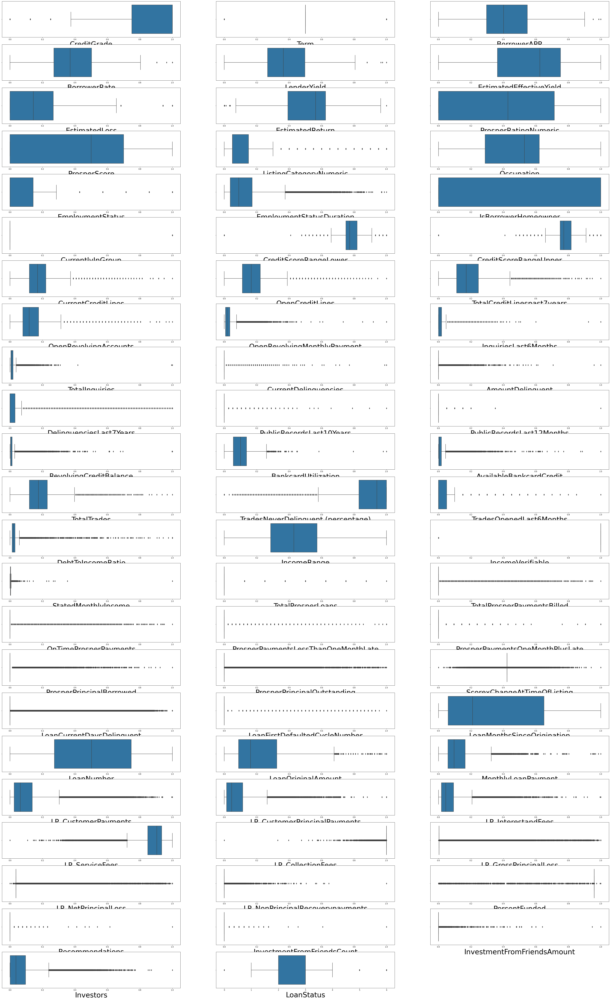

In [74]:
#checking for outliers in the data
plt.figure(figsize=(60,100))
for i in range(len(rescaledProsper_Clean.columns)):
    plt.subplot(23,3,i+1)
    sns.boxplot(x=rescaledProsper_Clean.iloc[ : , i])
    plt.xlabel(rescaledProsper_Clean.columns[i], size= 39)

In [75]:
# Removing target variable before transforming the data 
Target_Feature = rescaledProsper_Clean.pop('LoanStatus')

In [76]:
#create log-transformed data
rescaledProsper_Clean_log = np.cbrt(rescaledProsper_Clean)


In [77]:
rescaledProsper_Clean_log.head(10)

,CreditGrade,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,0.721125,0.793701,0.679433,0.682267,0.665337,0.713683,0.000000,0.731689,0.000000,0.000000,0.000000,0.809421,1.000000,0.138365,1.0,1.0,0.899289,0.899289,0.439244,0.419974,0.421016,0.269656,0.117000,0.305711,0.199294,0.288836,0.10058,0.343143,0.000000,0.0,0.000000,0.000000,0.132400,0.443616,0.932170,0.000000,0.257043,0.658634,1.0,0.120780,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.000000,0.750206,0.0,0.0,0.920516,0.519540,0.628102,0.527475,0.654236,0.645760,0.501792,0.913741,1.0,0.155415,0.332554,0.0,0.986485,0.0,0.0,0.0,0.600305
1,1.000000,0.793701,0.607924,0.569725,0.567829,0.805116,0.408231,0.798437,0.949914,0.887904,0.464159,0.853257,0.000000,0.387705,0.0,0.0,0.917647,0.917647,0.619097,0.637644,0.586255,0.634051,0.296095,0.305711,0.236289,0.000000,0.00000,0.000000,0.297444,0.0,0.140584,0.328020,0.251377,0.612833,1.000000,0.464159,0.261987,0.753947,1.0,0.151829,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.000000,0.750206,0.0,0.0,0.000000,0.995902,0.642078,0.521283,0.038649,0.000000,0.053186,0.984425,1.0,0.155415,0.332554,0.0,0.986485,0.0,0.0,0.0,0.000000
2,0.908560,0.793701,0.817345,0.820691,0.792382,0.713683,0.000000,0.731689,0.000000,0.000000,0.000000,0.809421,0.658634,0.446042,0.0,1.0,0.817058,0.817058,0.553413,0.550321,0.195418,0.000000,0.000000,0.000000,0.138183,0.229249,0.00000,0.000000,0.000000,0.0,0.181254,0.465455,0.185120,0.558921,0.979586,0.000000,0.181652,0.949914,1.0,0.105984,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.000000,0.750206,0.0,0.0,0.950969,0.361822,0.388976,0.379769,0.468620,0.440960,0.423690,0.972333,1.0,0.155415,0.332554,0.0,0.986485,0.0,0.0,0.0,0.322910
3,1.000000,0.793701,0.616921,0.580660,0.578728,0.810503,0.408231,0.804335,0.949914,0.965489,0.928318,0.911609,0.000000,0.530938,1.0,0.0,0.968729,0.968729,0.439244,0.452403,0.586255,0.515833,0.197248,0.000000,0.138183,0.363910,0.27883,0.520992,0.000000,0.0,0.100193,0.188733,0.362376,0.590928,0.912581,0.000000,0.246539,0.658634,1.0,0.117996,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.000000,0.750206,0.0,0.0,0.542884,0.827349,0.642078,0.522653,0.501875,0.488942,0.407182,0.927938,1.0,0.155415,0.332554,0.0,0.986485,0.0,0.0,0.0,0.509363
4,1.000000,0.793701,0.779567,0.748349,0.745859,0.899561,0.632247,0.836872,0.753947,0.736806,0.464159,0.660293,0.000000,0.387705,1.0,0.0,0.917647,0.917647,0.685436,0.705971,0.705230,0.489997,0.244862,0.211968,0.287432,0.000000,0.00000,0.000000,0.000000,0.0,0.162786,0.514426,0.102452,0.676443,0.983048,0.464159,0.296151,0.893904,1.0,0.176262,0.5,0.427292,0.427292,0.0,0.0,0.53336,0.751375,0.750206,0.0,0.0,0.391487,0.909463,0.743960,0.630368,0.410816,0.354800,0.431968,0.953732,1.0,0.1

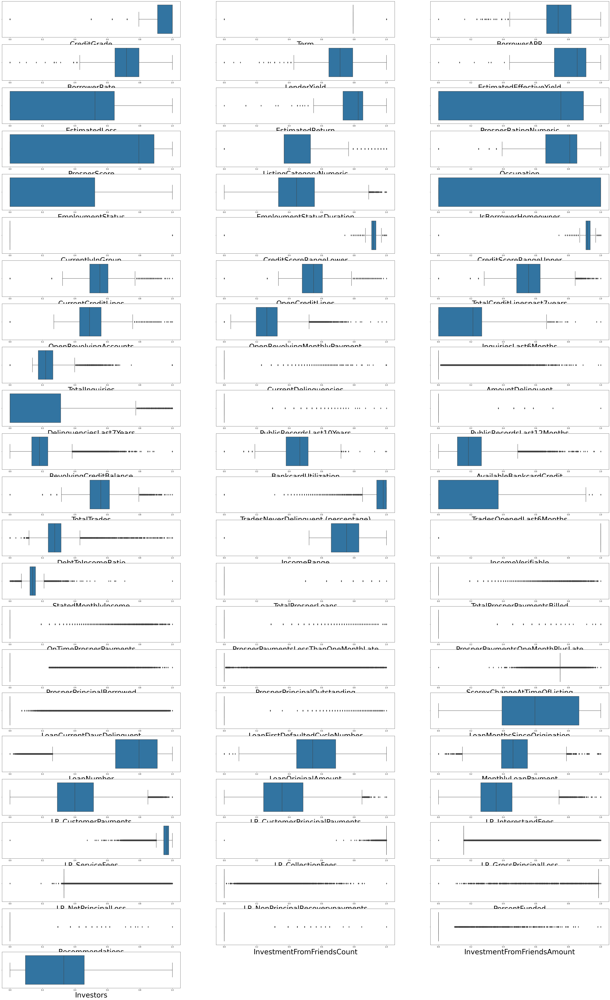

In [78]:
#checking for outliers in the data
plt.figure(figsize=(60,100))
for i in range(len(rescaledProsper_Clean_log.columns)):
    plt.subplot(23,3,i+1)
    sns.boxplot(x=rescaledProsper_Clean_log.iloc[ : , i])
    plt.xlabel(rescaledProsper_Clean_log.columns[i], size= 39)

In [79]:
rescaledProsper_Clean_log.insert(0, 'LoanStatus', Target_Feature)

In [80]:
#to standardize data (l0 mean, 1 standarddev)

array=rescaledProsper_Clean_log.values
#separate array into input and output components
x = array[:,1:]
y = array[:,0]
scaler= StandardScaler().fit(x)
standardX=  scaler.transform (x)
#summarize transformed data
set_printoptions(precision=3)

print(standardX[0:1,:])

[[-0.94   0.511 -0.571 -0.345 -0.499 -1.412 -1.572 -1.485 -1.629 -1.639
  -1.756  0.365  2.186 -1.852  0.991  2.821 -0.456 -0.456 -1.    -1.112
  -1.082 -1.558 -1.328  1.071 -0.171  1.798  1.045  0.869 -0.555 -0.111
  -2.049 -3.02  -0.574 -1.098 -0.404 -0.894 -0.03  -0.769  0.287 -0.559
  -0.484 -0.467 -0.467 -0.175 -0.056 -0.468 -0.364  0.058 -0.414 -0.407
   1.324 -1.23   0.45   0.512  1.441  1.513  0.979 -1.189  0.105 -0.38
  -0.351 -0.155  0.073 -0.195 -0.137 -0.118  1.413]]


In [81]:
#convert to a dataframe
StanProsper_Clean = pd.DataFrame(standardX)
StanProsper_Clean.columns = ['CreditGrade', 'Term', 'BorrowerAPR', 'BorrowerRate', 'LenderYield',
       'EstimatedEffectiveYield', 'EstimatedLoss', 'EstimatedReturn',
       'ProsperRatingNumeric', 'ProsperScore', 'ListingCategoryNumeric',
        'Occupation', 'EmploymentStatus',
       'EmploymentStatusDuration', 'IsBorrowerHomeowner', 'CurrentlyInGroup',
       'CreditScoreRangeLower', 'CreditScoreRangeUpper', 'CurrentCreditLines',
       'OpenCreditLines', 'TotalCreditLinespast7years',
       'OpenRevolvingAccounts', 'OpenRevolvingMonthlyPayment',
       'InquiriesLast6Months', 'TotalInquiries', 'CurrentDelinquencies',
       'AmountDelinquent', 'DelinquenciesLast7Years',
       'PublicRecordsLast10Years', 'PublicRecordsLast12Months',
       'RevolvingCreditBalance', 'BankcardUtilization',
       'AvailableBankcardCredit', 'TotalTrades',
       'TradesNeverDelinquent (percentage)', 'TradesOpenedLast6Months',
       'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable',
       'StatedMonthlyIncome', 'TotalProsperLoans',
       'TotalProsperPaymentsBilled', 'OnTimeProsperPayments',
       'ProsperPaymentsLessThanOneMonthLate',
       'ProsperPaymentsOneMonthPlusLate', 'ProsperPrincipalBorrowed',
       'ProsperPrincipalOutstanding', 'ScorexChangeAtTimeOfListing',
       'LoanCurrentDaysDelinquent', 'LoanFirstDefaultedCycleNumber',
       'LoanMonthsSinceOrigination', 'LoanNumber', 'LoanOriginalAmount',
       'MonthlyLoanPayment', 'LP_CustomerPayments',
       'LP_CustomerPrincipalPayments', 'LP_InterestandFees', 'LP_ServiceFees',
       'LP_CollectionFees', 'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss',
       'LP_NonPrincipalRecoverypayments', 'PercentFunded', 'Recommendations',
       'InvestmentFromFriendsCount', 'InvestmentFromFriendsAmount',
       'Investors'] 
StanProsper_Clean['LoanStatus'] = rescaledProsper_Clean_log['LoanStatus']
StanProsper_Clean.head()

,CreditGrade,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,LoanStatus
0,-0.940187,0.511233,-0.570877,-0.344510,-0.498786,-1.412015,-1.572225,-1.484579,-1.628850,-1.639405,-1.755704,0.364514,2.185904,-1.851845,0.991096,2.820995,-0.455838,-0.455838,-1.000277,-1.112390,-1.082161,-1.557901,-1.328222,1.070776,-0.171318,1.797864,1.045374,0.869067,-0.555113,-0.110521,-2.049251,-3.019971,-0.574263,-1.097539,-0.404402,-0.893618,-0.029760,-0.769170,0.28697,-0.558560,-0.483628,-0.466983,-0.466711,-0.174904,-0.055908,-0.468356,-0.363773,0.05839,-0.413688,-0.40737,1.323874,-1.229973,0.449695,0.511661,1.441330,1.512892,0.979472,-1.189044,0.104879,-0.379848,-0.351084,-0.154897,0.072578,-0.194862,-0.136557,-0.118443,1.413312,2
1,0.440405,0.511233,-1.294391,-1.493878,-1.504557,-0.392318,-0.081253,-0.269534,0.919306,0.735005,0.225825,0.567600,-0.764426,-0.346483,-1.008984,-0.354485,-0.021432,-0.021432,0.767090,0.966755,0.337570,1.107061,0.331994,1.070776,0.245539,-0.482487,-0.328589,-0.626996,1.616215,-0.110521,-0.510635,-0.669673,0.463674,0.619847,0.663067,1.261044,0.019462,-0.014392,0.28697,0.357795,-0.483628,-0.466983,-0.466711,-0.174904,-0.055908,-0.468356,-0.363773,0.05839,-0.413688,-0.40737,-2.448218,1.248322,0.523747,0.459617,-2.096292,-2.018971,-2.061139,0.828409,0.104879,-0.379848,-0.351084,-0.154897,0.072578,-0.194862,-0.136557,-0.118443,-1.414106,3
2,-0.012274,0.511233,0.824483,1.069172,0.811640,-1.412015,-1.572225,-1.484579,-1.628850,-1.639405,-1.755704,0.364514,1.178761,0.005718,-1.008984,2.820995,-2.401679,-2.401679,0.121630,0.132666,-3.020493,-3.529996,-2.412812,-1.050324,-0.859913,1.327429,-0.328589,-0.626996,-0.555113,-0.110521,-0.065530,0.315063,-0.114344,0.072693,0.341806,-0.893618,-0.780296,1.537446,0.28697,-0.995220,-0.483628,-0.466983,-0.466711,-0.174904,-0.055908,-0.468356,-0.363773,0.05839,-0.413688,-0.40737,1.448660,-2.050509,-0.817328,-0.729869,0.374646,0.392777,0.450105,0.483290,0.104879,-0.379848,-0.351084,-0.154897,0.072578,-0.194862,-0.136557,-0.118443,0.106788,2
3,0.440405,0.511233,-1.203362,-1.382197,-1.392136,-0.332245,-0.081253,-0.162168,0.919306,0.942482,2.207355,0.837936,-0.764426,0.518267,0.991096,-0.354485,1.187350,1.187350,-1.000277,-0.802631,0.337570,0.242487,-0.584315,-1.050324,-0.859913,2.390574,3.480338,1.644468,-0.555113,-0.110521,-0.952694,-1.667681,1.432012,0.397524,-0.712684,-0.893618,-0.134324,-0.769170,0.28697,-0.640721,-0.483628,-0.466983,-0.466711,-0.174904,-0.055908,-0.468356,-0.363773,0.05839,-0.413688,-0.40737,-0.223590,0.371417,0.523747,0.471127,0.565753,0.655203,0.338215,-0.783834,0.104879,-0.379848,-0.351084,-0.154897,0.072578,-0.194862,-0.136557,-0.118443,0.984979,3
4,0.440405,0.511233,0.

In [82]:
StanProsper_Clean.shape

(113937, 68)

In [83]:
#check if the data is well behaved when standardize after converting to dataframe
StanProsper_Clean.describe().T

,count,mean,std,min,25%,50%,75%,max
CreditGrade,113937.0,-2.207197e-15,1.000004,-4.510167,-0.012274,0.440405,0.440405,0.440405
Term,113937.0,-3.097922e-15,1.000004,-1.903159,0.511233,0.511233,0.511233,1.138785
BorrowerAPR,113937.0,-2.129993e-15,1.000004,-7.445238,-0.701472,0.020966,0.834552,2.672546
BorrowerRate,113937.0,4.200191e-16,1.000004,-7.312306,-0.716853,0.018454,0.807077,2.900398
LenderYield,113937.0,5.133294e-16,1.000004,-7.361527,-0.719083,0.004400,0.811640,2.953153
EstimatedEffectiveYield,113937.0,-2.905759e-15,1.000004,-9.371267,-1.412015,0.164022,0.769833,1.781097
EstimatedLoss,113937.0,-4.027276e-16,1.000004,-1.572225,-1.572225,0.338421,0.777794,2.080050
EstimatedReturn,113937.0,-1.442052e-15,1.000004,-14.803890,-1.484579,0.227546,0.758110,3.399617
ProsperRatingNumeric,113937.0,-3.469368e-16,1.000004,-1.628850,-1.628850,0.393623,0.769057,1.053662
ProsperScore,113937.0,-5.939889e-16,1.000004,-1.639405,-1.639405,0.483088,0.735005,1.034769


In [87]:
#to normalize data 

array=StanProsper_Clean.values
#separate array into input and output components
x=array[ :,0:67]
y=array[ :, 67]
scaler= Normalizer().fit(x)
normalizedX=  scaler.transform (x)
#summarize transformed data
set_printoptions(precision=3)
 
print(normalizedX[0:1,:])

[[-0.105  0.057 -0.064 -0.039 -0.056 -0.158 -0.176 -0.166 -0.182 -0.183
  -0.196  0.041  0.245 -0.207  0.111  0.316 -0.051 -0.051 -0.112 -0.124
  -0.121 -0.174 -0.149  0.12  -0.019  0.201  0.117  0.097 -0.062 -0.012
  -0.229 -0.338 -0.064 -0.123 -0.045 -0.1   -0.003 -0.086  0.032 -0.063
  -0.054 -0.052 -0.052 -0.02  -0.006 -0.052 -0.041  0.007 -0.046 -0.046
   0.148 -0.138  0.05   0.057  0.161  0.169  0.11  -0.133  0.012 -0.043
  -0.039 -0.017  0.008 -0.022 -0.015 -0.013  0.158]]


In [88]:
#convert to a dataframe
normProsper_Clean = pd.DataFrame(normalizedX)
normProsper_Clean.columns = ['CreditGrade', 'Term', 'BorrowerAPR', 'BorrowerRate', 'LenderYield',
       'EstimatedEffectiveYield', 'EstimatedLoss', 'EstimatedReturn',
       'ProsperRatingNumeric', 'ProsperScore', 'ListingCategoryNumeric',
       'Occupation', 'EmploymentStatus',
       'EmploymentStatusDuration', 'IsBorrowerHomeowner', 'CurrentlyInGroup',
       'CreditScoreRangeLower', 'CreditScoreRangeUpper', 'CurrentCreditLines',
       'OpenCreditLines', 'TotalCreditLinespast7years',
       'OpenRevolvingAccounts', 'OpenRevolvingMonthlyPayment',
       'InquiriesLast6Months', 'TotalInquiries', 'CurrentDelinquencies',
       'AmountDelinquent', 'DelinquenciesLast7Years',
       'PublicRecordsLast10Years', 'PublicRecordsLast12Months',
       'RevolvingCreditBalance', 'BankcardUtilization',
       'AvailableBankcardCredit', 'TotalTrades',
       'TradesNeverDelinquent (percentage)', 'TradesOpenedLast6Months',
       'DebtToIncomeRatio', 'IncomeRange', 'IncomeVerifiable',
       'StatedMonthlyIncome', 'TotalProsperLoans',
       'TotalProsperPaymentsBilled', 'OnTimeProsperPayments',
       'ProsperPaymentsLessThanOneMonthLate',
       'ProsperPaymentsOneMonthPlusLate', 'ProsperPrincipalBorrowed',
       'ProsperPrincipalOutstanding', 'ScorexChangeAtTimeOfListing',
       'LoanCurrentDaysDelinquent', 'LoanFirstDefaultedCycleNumber',
       'LoanMonthsSinceOrigination', 'LoanNumber', 'LoanOriginalAmount',
       'MonthlyLoanPayment', 'LP_CustomerPayments',
       'LP_CustomerPrincipalPayments', 'LP_InterestandFees', 'LP_ServiceFees',
       'LP_CollectionFees', 'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss',
       'LP_NonPrincipalRecoverypayments', 'PercentFunded', 'Recommendations',
       'InvestmentFromFriendsCount', 'InvestmentFromFriendsAmount',
       'Investors'] 
normProsper_Clean['LoanStatus'] = StanProsper_Clean['LoanStatus']
normProsper_Clean.head()

,CreditGrade,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,LoanStatus
0,-0.105216,0.057212,-0.063887,-0.038554,-0.055819,-0.158018,-0.175947,-0.166139,-0.182284,-0.183465,-0.196480,0.040793,0.244623,-0.207239,0.110913,0.315696,-0.051013,-0.051013,-0.111941,-0.124487,-0.121104,-0.174344,-0.148641,0.119830,-0.019172,0.201198,0.116987,0.097257,-0.062122,-0.012368,-0.229331,-0.337964,-0.064266,-0.122825,-0.045256,-0.100004,-0.003330,-0.086077,0.032115,-0.062508,-0.054123,-0.052260,-0.052229,-0.019573,-0.006257,-0.052414,-0.040710,0.006534,-0.046296,-0.045589,0.148154,-0.137646,0.050325,0.057260,0.161299,0.169307,0.109612,-0.133065,0.011737,-0.042509,-0.039290,-0.017334,0.008122,-0.021807,-0.015282,-0.013255,0.158163,2
1,0.064397,0.074754,-0.189269,-0.218438,-0.219999,-0.057365,-0.011881,-0.039412,0.134423,0.107474,0.033021,0.082996,-0.111776,-0.050664,-0.147536,-0.051834,-0.003134,-0.003134,0.112165,0.141361,0.049360,0.161877,0.048545,0.156571,0.035903,-0.070550,-0.048047,-0.091681,0.236326,-0.016161,-0.074666,-0.097921,0.067799,0.090635,0.096955,0.184393,0.002846,-0.002104,0.041961,0.052318,-0.070717,-0.068283,-0.068243,-0.025575,-0.008175,-0.068484,-0.053192,0.008538,-0.060490,-0.059566,-0.357984,0.182532,0.076583,0.067206,-0.306524,-0.295218,-0.301384,0.121132,0.015336,-0.055542,-0.051336,-0.022649,0.010612,-0.028493,-0.019968,-0.017319,-0.206774,3
2,-0.001317,0.054861,0.088476,0.114734,0.087098,-0.151525,-0.168717,-0.159312,-0.174794,-0.175926,-0.188407,0.039116,0.126494,0.000614,-0.108275,0.302724,-0.257727,-0.257727,0.013052,0.014237,-0.324133,-0.378808,-0.258922,-0.112711,-0.092278,0.142448,-0.035261,-0.067284,-0.059570,-0.011860,-0.007032,0.033810,-0.012270,0.007801,0.036680,-0.095895,-0.083734,0.164985,0.030795,-0.106798,-0.051899,-0.050112,-0.050083,-0.018769,-0.006000,-0.050260,-0.039037,0.006266,-0.044393,-0.043715,0.155457,-0.220042,-0.087708,-0.078323,0.040204,0.042149,0.048301,0.051862,0.011255,-0.040762,-0.037675,-0.016622,0.007788,-0.020911,-0.014654,-0.012710,0.011460,2
3,0.058825,0.068286,-0.160733,-0.184620,-0.185948,-0.044378,-0.010853,-0.021661,0.122792,0.125888,0.294837,0.111923,-0.102105,0.069225,0.132381,-0.047349,0.158595,0.158595,-0.133607,-0.107208,0.045089,0.032389,-0.078047,-0.140292,-0.114859,0.319310,0.464870,0.219652,-0.074147,-0.014762,-0.127252,-0.222753,0.191274,0.053097,-0.095193,-0.119361,-0.017942,-0.102738,0.038331,-0.085581,-0.064598,-0.062375,-0.062339,-0.023362,-0.007468,-0.062558,-0.048589,0.007799,-0.055256,-0.054412,-0.029865,0.049610,0.069957,0.062929,0.075568,0.087516,0.045176,-0.104697,0.014009,-0.050736,-0.046894,-0.020690,0.009694,-0.026028,-0.018240,-0.015820,0.131564,3
4,0.060694

In [89]:
normProsper_Clean.describe().T

,count,mean,std,min,25%,50%,75%,max
CreditGrade,113937.0,0.013830,0.115571,-0.650965,-0.000842,0.059464,0.074276,0.132278
Term,113937.0,-0.005669,0.153797,-0.495102,0.039681,0.062551,0.080356,0.283822
BorrowerAPR,113937.0,0.000644,0.135981,-0.532371,-0.096030,0.002732,0.104884,0.343531
BorrowerRate,113937.0,-0.001514,0.136509,-0.562056,-0.101118,0.002166,0.107652,0.345923
LenderYield,113937.0,-0.001494,0.136826,-0.452695,-0.101311,0.000622,0.107537,0.348062
EstimatedEffectiveYield,113937.0,0.014204,0.130415,-0.475803,-0.100686,0.024493,0.115631,0.327878
EstimatedLoss,113937.0,0.015969,0.127601,-0.305192,-0.094389,0.050899,0.113686,0.292830
EstimatedReturn,113937.0,0.014107,0.126610,-0.743481,-0.095913,0.034699,0.109994,0.507591
ProsperRatingNumeric,113937.0,0.018130,0.128161,-0.316184,-0.094249,0.065945,0.116686,0.246722
ProsperScore,113937.0,0.017124,0.126750,-0.318233,-0.094859,0.061795,0.112086,0.261815


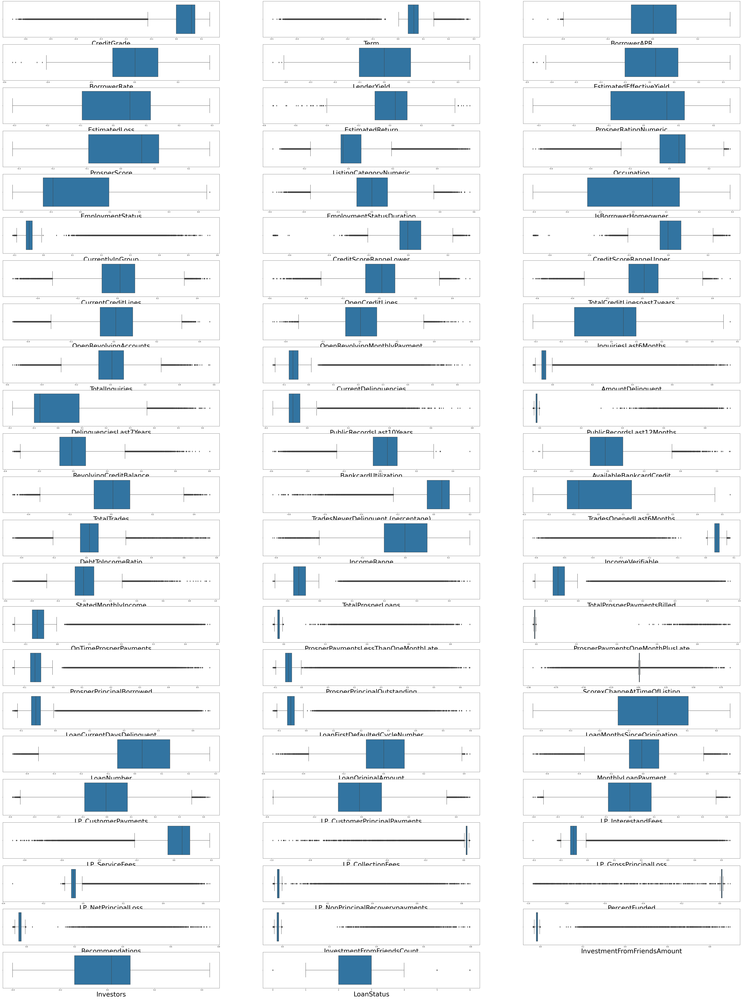

In [90]:
#checking for outliers in the data
plt.figure(figsize=(80,110))
for i in range(len(normProsper_Clean.columns)):
    plt.subplot(23,3,i+1)
    sns.boxplot(x=normProsper_Clean.iloc[ : , i])
    plt.xlabel(normProsper_Clean.columns[i], size=39)

In [91]:
Prosper_Clean_Current = normProsper_Clean[normProsper_Clean['LoanStatus'] == 3]
Prosper_Clean_NonCurrent = normProsper_Clean[normProsper_Clean['LoanStatus'] != 3]

In [92]:
Prosper_Clean_Current.shape

(56576, 68)

In [93]:
Prosper_Clean_Current.head()

,CreditGrade,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,LoanStatus
1,0.064397,0.074754,-0.189269,-0.218438,-0.219999,-0.057365,-0.011881,-0.039412,0.134423,0.107474,0.033021,0.082996,-0.111776,-0.050664,-0.147536,-0.051834,-0.003134,-0.003134,0.112165,0.141361,0.049360,0.161877,0.048545,0.156571,0.035903,-0.070550,-0.048047,-0.091681,0.236326,-0.016161,-0.074666,-0.097921,0.067799,0.090635,0.096955,0.184393,0.002846,-0.002104,0.041961,0.052318,-0.070717,-0.068283,-0.068243,-0.025575,-0.008175,-0.068484,-0.053192,0.008538,-0.060490,-0.059566,-0.357984,0.182532,0.076583,0.067206,-0.306524,-0.295218,-0.301384,0.121132,0.015336,-0.055542,-0.051336,-0.022649,0.010612,-0.028493,-0.019968,-0.017319,-0.206774,3
3,0.058825,0.068286,-0.160733,-0.184620,-0.185948,-0.044378,-0.010853,-0.021661,0.122792,0.125888,0.294837,0.111923,-0.102105,0.069225,0.132381,-0.047349,0.158595,0.158595,-0.133607,-0.107208,0.045089,0.032389,-0.078047,-0.140292,-0.114859,0.319310,0.464870,0.219652,-0.074147,-0.014762,-0.127252,-0.222753,0.191274,0.053097,-0.095193,-0.119361,-0.017942,-0.102738,0.038331,-0.085581,-0.064598,-0.062375,-0.062339,-0.023362,-0.007468,-0.062558,-0.048589,0.007799,-0.055256,-0.054412,-0.029865,0.049610,0.069957,0.062929,0.075568,0.087516,0.045176,-0.104697,0.014009,-0.050736,-0.046894,-0.020690,0.009694,-0.026028,-0.018240,-0.015820,0.131564,3
4,0.060694,0.070455,0.060948,0.045529,0.045722,0.091090,0.101557,0.059275,0.054247,0.045608,0.031122,-0.044979,-0.105348,-0.047750,0.136586,-0.048853,-0.002954,-0.002954,0.195556,0.223175,0.187400,0.007378,-0.019698,0.057932,0.113256,-0.066493,-0.045284,-0.086408,-0.076502,-0.015231,-0.036886,0.091776,-0.115147,0.174392,0.054613,0.173789,0.049554,0.150755,0.039548,0.148683,0.246441,0.215884,0.218742,-0.024104,-0.007705,0.326217,0.508459,0.008047,-0.057012,-0.056141,-0.116312,0.110060,0.146575,0.189703,0.005852,-0.010813,0.069763,-0.006563,0.014454,-0.052348,-0.048384,-0.021347,0.010002,-0.026855,-0.018819,-0.016323,-0.031344,3
5,0.061990,-0.267881,-0.103066,-0.106945,-0.107764,0.000241,0.034138,0.007219,0.108250,0.145650,-0.025753,0.079893,-0.107598,0.027210,0.139503,-0.049896,0.084357,0.084357,0.231894,0.193395,0.191401,0.155826,0.253857,-0.147840,-0.064073,-0.067913,-0.046251,-0.088254,-0.078136,-0.015557,0.254915,-0.018444,0.384728,0.240125,0.093331,-0.125782,0.098160,0.153974,0.040393,0.118529,-0.068074,-0.065731,-0.065692,-0.024619,-0.007869,-0.065924,-0.051203,0.008219,-0.058229,-0.057340,-0.165380,0.154242,0.149705,0.079447,-0.119376,-0.118028,-0.077170,0.065728,0.014762,-0.053466,-0.049417,-0.021803,0.010216,-0.027428,-0.019221,-0.016672,-0.199044,3
6,0.080732,0.093715,0.200096,0.1888

In [94]:
Prosper_Clean_NonCurrent.shape

(57361, 68)

In [95]:
Prosper_Clean_NonCurrent.head()

,CreditGrade,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRatingNumeric,ProsperScore,ListingCategoryNumeric,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,LoanStatus
0,-0.105216,0.057212,-0.063887,-0.038554,-0.055819,-0.158018,-0.175947,-0.166139,-0.182284,-0.183465,-0.196480,0.040793,0.244623,-0.207239,0.110913,0.315696,-0.051013,-0.051013,-0.111941,-0.124487,-0.121104,-0.174344,-0.148641,0.119830,-0.019172,0.201198,0.116987,0.097257,-0.062122,-0.012368,-0.229331,-0.337964,-0.064266,-0.122825,-0.045256,-0.100004,-0.003330,-0.086077,0.032115,-0.062508,-0.054123,-0.052260,-0.052229,-0.019573,-0.006257,-0.052414,-0.040710,0.006534,-0.046296,-0.045589,0.148154,-0.137646,0.050325,0.057260,0.161299,0.169307,0.109612,-0.133065,0.011737,-0.042509,-0.039290,-0.017334,0.008122,-0.021807,-0.015282,-0.013255,0.158163,2
2,-0.001317,0.054861,0.088476,0.114734,0.087098,-0.151525,-0.168717,-0.159312,-0.174794,-0.175926,-0.188407,0.039116,0.126494,0.000614,-0.108275,0.302724,-0.257727,-0.257727,0.013052,0.014237,-0.324133,-0.378808,-0.258922,-0.112711,-0.092278,0.142448,-0.035261,-0.067284,-0.059570,-0.011860,-0.007032,0.033810,-0.012270,0.007801,0.036680,-0.095895,-0.083734,0.164985,0.030795,-0.106798,-0.051899,-0.050112,-0.050083,-0.018769,-0.006000,-0.050260,-0.039037,0.006266,-0.044393,-0.043715,0.155457,-0.220042,-0.087708,-0.078323,0.040204,0.042149,0.048301,0.051862,0.011255,-0.040762,-0.037675,-0.016622,0.007788,-0.020911,-0.014654,-0.012710,0.011460,2
11,-0.099345,0.054020,-0.083702,-0.078357,-0.078959,-0.149201,-0.166130,-0.156869,-0.172113,-0.173228,-0.185517,0.131811,0.082195,-0.096999,-0.106615,-0.037457,-0.048166,-0.048166,-0.225734,-0.204987,-0.141746,-0.164616,-0.119073,0.113144,0.025945,0.224841,0.208671,0.033334,-0.058656,-0.011678,-0.106998,-0.033326,-0.036497,-0.182508,-0.367600,-0.094425,0.041938,-0.194969,0.030323,-0.128852,-0.051103,-0.049344,-0.049315,-0.018481,-0.005908,-0.049489,-0.038438,0.006170,-0.043712,-0.043045,0.138177,-0.121439,-0.304141,-0.195298,-0.067629,-0.036660,-0.186829,0.086224,0.011082,-0.040137,-0.037097,-0.016367,0.007669,-0.020590,-0.014429,-0.012515,0.025971,2
12,0.085192,0.098893,-0.071010,-0.109204,-0.110079,0.021811,0.065464,0.022075,0.148767,0.064018,-0.035392,0.151049,-0.147871,-0.391559,-0.195178,-0.068572,-0.004146,-0.004146,-0.012776,-0.056048,0.065300,0.080122,0.014704,0.081316,0.010579,-0.093332,-0.063562,-0.121286,-0.107381,-0.021379,-0.011557,0.094962,-0.034654,-0.020251,0.128264,-0.172862,0.003765,-0.148789,0.055512,-0.161829,-0.093553,-0.090334,-0.090281,-0.033834,-0.010815,-0.090599,-0.070368,0.011295,-0.000045,-0.078802,-0.258418,0.216655,-0.100485,-0.118543,-0.281405,-0.246339,-0.275820,0.150967,0.020288,-0.073478,-0.067914,-0.029963,0.014039,-0.037694,-0.026416,-0.022912,-0

In [96]:
Prosper_Clean_NonCurrent.describe().T

,count,mean,std,min,25%,50%,75%,max
CreditGrade,57361.0,-0.041443,0.141924,-0.650965,-0.105213,-0.000731,0.060170,0.120522
Term,57361.0,0.041602,0.090274,-0.441683,0.048917,0.060631,0.073088,0.283822
BorrowerAPR,57361.0,0.005369,0.137539,-0.532371,-0.093471,0.013108,0.112172,0.343531
BorrowerRate,57361.0,0.011098,0.134792,-0.562056,-0.085207,0.020547,0.118593,0.345923
LenderYield,57361.0,0.011353,0.134471,-0.452695,-0.085309,0.018553,0.118767,0.348062
EstimatedEffectiveYield,57361.0,-0.041486,0.140900,-0.475803,-0.158775,-0.097667,0.076449,0.327878
EstimatedLoss,57361.0,-0.045177,0.143291,-0.305192,-0.176259,-0.089261,0.094141,0.292830
EstimatedReturn,57361.0,-0.035468,0.149599,-0.743481,-0.166990,-0.092656,0.106433,0.507591
ProsperRatingNumeric,57361.0,-0.059162,0.133466,-0.316184,-0.182607,-0.086212,0.065405,0.236664
ProsperScore,57361.0,-0.050568,0.141611,-0.318233,-0.183790,-0.086771,0.085038,0.261815


<AxesSubplot:>

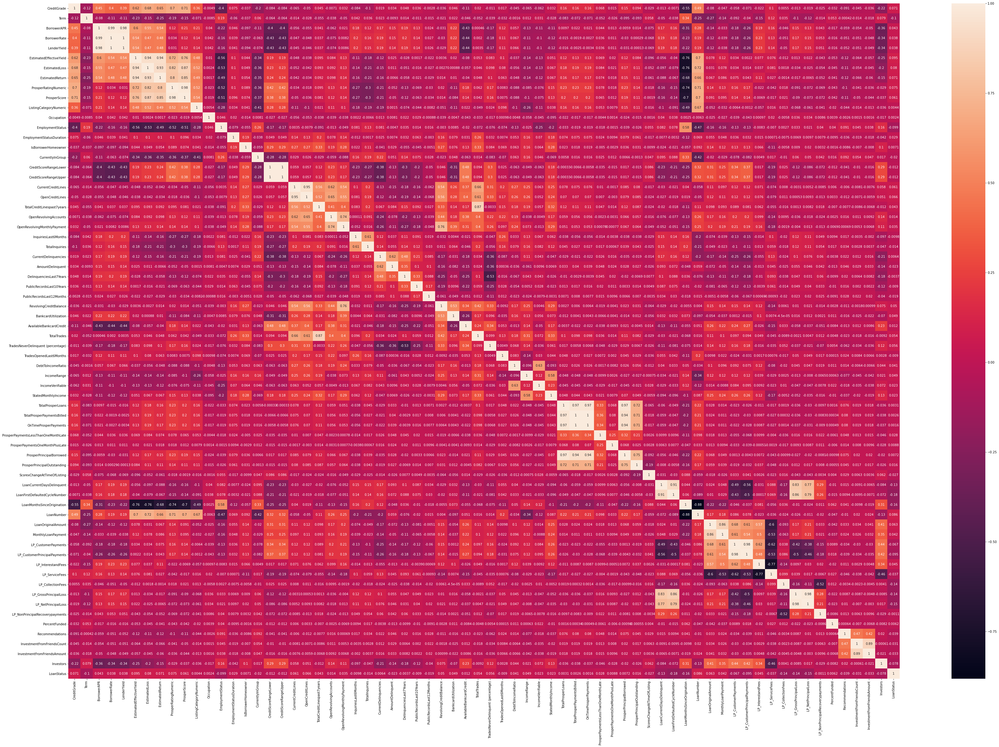

In [97]:
cor = Prosper_Clean_NonCurrent.corr()
plt.figure(figsize = (60,40))
sns.heatmap(cor, annot = True)

In [98]:
# Removing Target variable before dealing with outliers for the Prosper_NonCurrent dataframe
encodedFeature1 = Prosper_Clean_NonCurrent.pop('LoanStatus')

In [99]:
# Removing outliers
def Outliers(Prosper_Clean_NonCurrent, feature):
    IQ1 = Prosper_Clean_NonCurrent[feature].quantile(0.25)
    IQ3 = Prosper_Clean_NonCurrent[feature].quantile(0.75)
    IQR = IQ3 - IQ1
    
    lower_bound = IQ1 - 1.5 * IQR
    upper_bound = IQ3 + 1.5 * IQR
    
    index = Prosper_Clean_NonCurrent.index[ (Prosper_Clean_NonCurrent[feature] < lower_bound) | (Prosper_Clean_NonCurrent[feature] > upper_bound) ]
    return index

In [100]:
# Getting index of all the outliers
index = []
for i in Prosper_Clean_NonCurrent.columns:
    index.extend(Outliers(Prosper_Clean_NonCurrent, i))
index = set(index)
print("Total number of outliers are {}".format(len(index)))

# Dropping all the outliers
Prosper_Clean_NonCurrent.drop(index, inplace = True, axis = 0)
Prosper_Clean_NonCurrent.shape

Total number of outliers are 54025


(3336, 67)

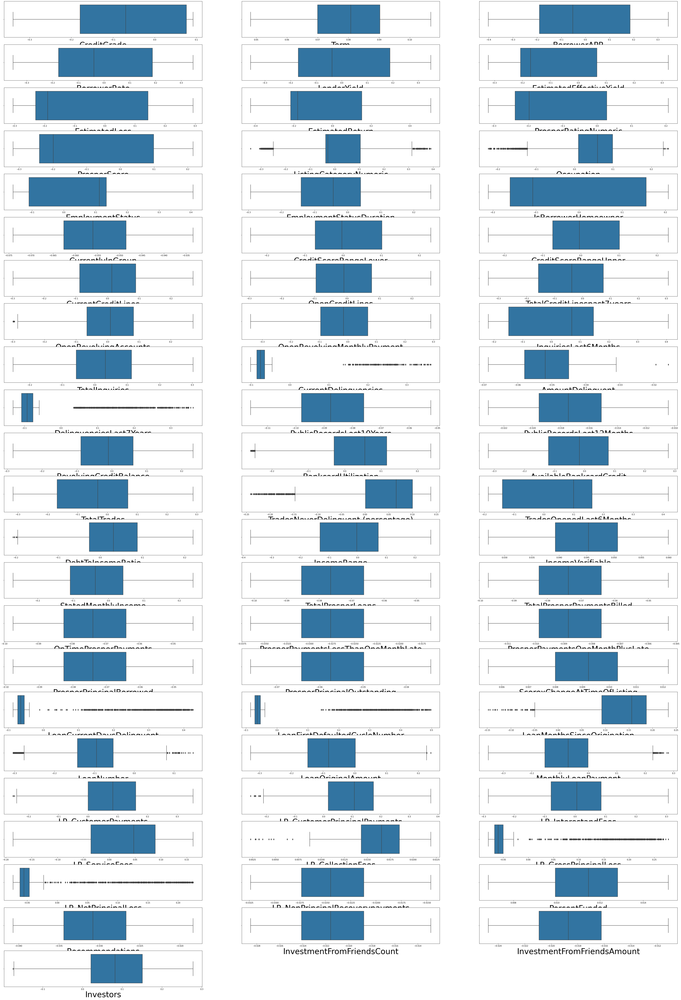

In [101]:
#checking for outliers in the data
plt.figure(figsize=(60,90))
for i in range(len(Prosper_Clean_NonCurrent.columns)):
    plt.subplot(23,3,i+1)
    sns.boxplot(x=Prosper_Clean_NonCurrent.iloc[ : , i])
    plt.xlabel(Prosper_Clean_NonCurrent.columns[i], size=39)

In [102]:
Prosper_Clean_NonCurrent.insert(0, 'LoanStatus', encodedFeature1)

In [103]:
# Removing Target variable before dealing with outliers for the Prosper_Current dataframe
encodedFeature2 = Prosper_Clean_Current.pop('LoanStatus')

In [104]:
# Removing outliers
def Outliers(Prosper_Clean_Current, feature):
    IQ1 = Prosper_Clean_Current[feature].quantile(0.25)
    IQ3 = Prosper_Clean_Current[feature].quantile(0.75)
    IQR = IQ3 - IQ1
    
    lower_bound = IQ1 - 1.5 * IQR
    upper_bound = IQ3 + 1.5 * IQR
    
    index = Prosper_Clean_Current.index[ (Prosper_Clean_Current[feature] < lower_bound) | (Prosper_Clean_Current[feature] > upper_bound) ]
    return index

In [105]:
# Getting index of all the outliers
index = []
for i in Prosper_Clean_Current.columns:
    index.extend(Outliers(Prosper_Clean_Current, i))
index = set(index)
print("Total number of outliers are {}".format(len(index)))

# Dropping all the outliers
Prosper_Clean_Current.drop(index, inplace = True, axis = 0)
Prosper_Clean_Current.shape

Total number of outliers are 43801


(12775, 67)

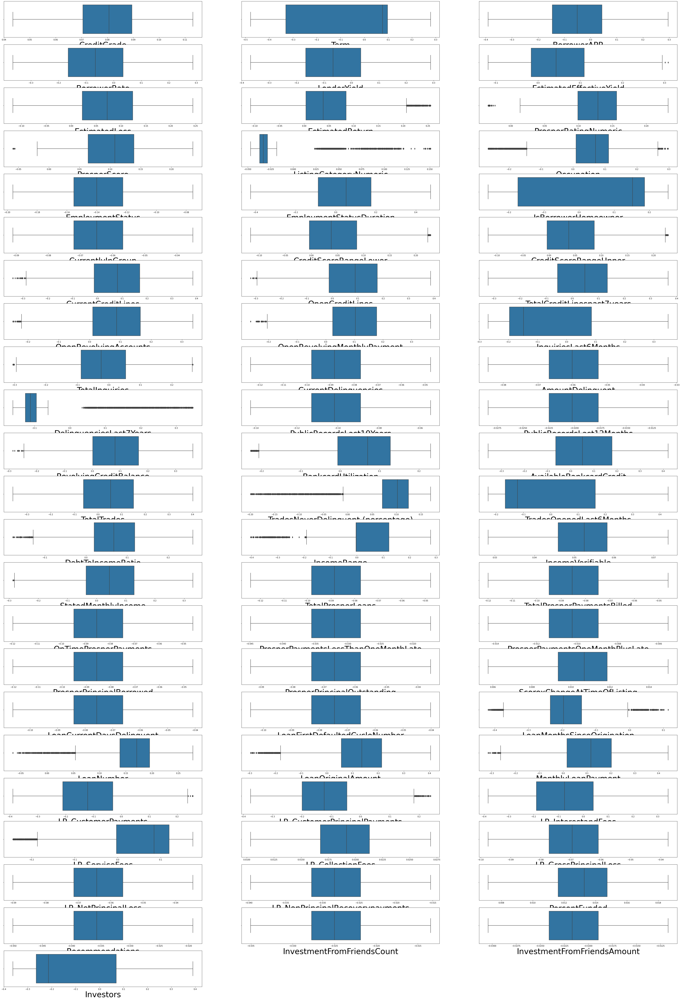

In [106]:
#checking for outliers in the data
plt.figure(figsize=(60,90))
for i in range(len(Prosper_Clean_Current.columns)):
    plt.subplot(23,3,i+1)
    sns.boxplot(x=Prosper_Clean_Current.iloc[ : , i])
    plt.xlabel(Prosper_Clean_Current.columns[i], size=39)

In [107]:
# Feature Selection using Recursive Feature Elimination on the Prosper_NonCurrent dataframe

dataframe = Prosper_Clean_NonCurrent
array = dataframe.values
X = array[:,1:]
Y = array[:,0]

model = LogisticRegression(max_iter= 1000)

rfe = RFE(model, 20)
fit = rfe.fit(X, Y)
print("Num Features:{}".format(fit.n_features_))
print('\n')
print("Selected Feature:{}".format(fit.support_))
print('\n')
print("Feature Ranking:{}".format(fit.ranking_))


Num Features:20


Selected Feature:[False False  True False False  True  True False False False False False
  True False False False False False False False  True False False False
 False  True False False False False False False False  True False False
  True False False False False False False False False False False False
  True  True  True  True  True  True  True  True  True  True False  True
  True False False False False False False]


Feature Ranking:[ 2 27  1 11 20  1  1 16 18  6  4 13  1 19  9 36 15 22 23  7  1 14 10  5
 34  1 37 17 26 45 25 33 21  1 12 28  1 24 38  3 29 31 32 40 48 30 35 47
  1  1  1  1  1  1  1  1  1  1 44  1  1 41 46 39 42 43  8]


In [108]:
Prosper_Clean_NonCurrent.info

<bound method DataFrame.info of         LoanStatus  CreditGrade      Term  BorrowerAPR  BorrowerRate  \
57               1     0.068276  0.079257     0.144998      0.133789   
59               2    -0.159224  0.086579    -0.091784     -0.053386   
88               2     0.078412  0.091023     0.267656      0.267520   
136              2    -0.143822  0.078204     0.016227      0.023760   
171              2     0.084310  0.097870    -0.273211     -0.285985   
173              2    -0.255263  0.064131    -0.194818     -0.168080   
194              2     0.085594  0.099359     0.183963      0.177418   
262              1     0.069895  0.081136     0.209724      0.202410   
265              2     0.075713  0.087890     0.260697      0.254830   
292              2     0.088071  0.102235     0.242319      0.231701   
308              1    -0.077363  0.068086    -0.001154      0.029974   
342              1     0.074104  0.086021     0.159268      0.153601   
344              1     0.056176 

In [109]:
Feature_Prosper_Clean_NonCurrent = Prosper_Clean_NonCurrent.iloc[:,[3,6,7,13,21,26,34,37,49,50,51,52,53,54,55,56,57,58,60,61]]
Feature_Prosper_Clean_NonCurrent ['LoanStatus'] = Prosper_Clean_NonCurrent['LoanStatus']
Feature_Prosper_Clean_NonCurrent.head(10)

,BorrowerAPR,EstimatedEffectiveYield,EstimatedLoss,EmploymentStatus,TotalCreditLinespast7years,CurrentDelinquencies,TotalTrades,DebtToIncomeRatio,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LoanStatus
57,0.144998,0.178139,0.145603,-0.118509,0.122892,-0.074800,0.073399,-0.020824,0.267103,0.385405,0.025922,0.000745,-0.192669,-0.179504,-0.110017,-0.117203,-0.050457,0.090026,0.204242,0.146983,1
59,-0.091784,-0.239130,-0.266262,0.131737,0.012772,-0.081711,0.026651,0.123209,-0.070060,-0.068990,0.224203,-0.204419,0.015861,0.014903,0.192886,0.199748,0.155000,-0.155196,-0.064329,-0.059457,2
88,0.267656,0.279263,0.218684,-0.136103,-0.068060,-0.085905,-0.171822,0.043001,-0.073655,-0.072531,0.041416,-0.010732,-0.092489,-0.060595,0.083797,0.113096,-0.012297,0.095951,-0.067630,-0.062509,2
136,0.016227,-0.215998,-0.240505,0.118994,0.042006,0.203058,-0.045024,-0.057424,-0.063282,-0.062316,0.176720,-0.102755,-0.125080,-0.132021,0.050609,0.060043,0.042656,0.014616,-0.058106,-0.053706,2
171,-0.273211,-0.117194,-0.031311,0.148916,-0.073180,-0.092366,-0.095449,0.089759,-0.079196,-0.077986,0.145541,-0.083745,0.001665,-0.024217,0.174960,0.210861,0.006566,-0.067900,-0.072717,-0.067211,2
173,-0.194818,-0.177129,-0.197226,0.097581,0.092814,-0.060525,0.120241,0.008391,-0.051895,-0.051102,0.175974,-0.199450,0.133419,0.139498,0.233184,0.264010,-0.011655,0.046951,-0.047650,-0.044041,2
194,0.183963,0.230566,0.172769,-0.148568,0.220946,-0.093772,0.257245,0.110948,-0.080401,-0.079173,0.051340,-0.018419,-0.111382,-0.095496,0.107847,0.114709,0.102681,0.022089,-0.073824,-0.068234,2
262,0.209724,0.225435,0.178143,-0.121320,-0.034788,-0.076574,-0.031399,-0.094954,0.257702,0.365768,0.004054,0.022452,-0.159675,-0.141441,-0.107093,-0.119817,-0.038222,0.091979,0.249050,0.196640,1
265,0.260697,0.266872,0.211157,-0.131418,-0.051441,-0.082948,-0.144363,0.080607,-0.071120,-0.070034,-0.008907,0.036719,-0.089305,-0.059087,0.073458,0.109203,-0.061914,0.108862,-0.065302,-0.060358,2
292,0.242319,0.266059,0.212600,-0.152868,0.271932,-0.096487,0.264692,0.031393,-0.082728,-0.081465,-0.018485,0.054542,-0.103881,-0.079054,0.116138,0.127027,0.096116,0.041528,-0.075961,-0.070209,2


In [110]:
Feature_Prosper_Clean_NonCurrent.columns

Index(['BorrowerAPR', 'EstimatedEffectiveYield', 'EstimatedLoss',
       'EmploymentStatus', 'TotalCreditLinespast7years',
       'CurrentDelinquencies', 'TotalTrades', 'DebtToIncomeRatio',
       'LoanCurrentDaysDelinquent', 'LoanFirstDefaultedCycleNumber',
       'LoanMonthsSinceOrigination', 'LoanNumber', 'LoanOriginalAmount',
       'MonthlyLoanPayment', 'LP_CustomerPayments',
       'LP_CustomerPrincipalPayments', 'LP_InterestandFees', 'LP_ServiceFees',
       'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss', 'LoanStatus'],
      dtype='object')

In [111]:
Feature_Prosper_Clean_NonCurrent.shape

(3336, 21)

In [112]:
Feature_Prosper_Current = Prosper_Clean_Current.iloc[:,[3,6,7,13,21,26,34,37,49,50,51,52,53,54,55,56,57,58,60,61]]
Feature_Prosper_Current.head(10)

,BorrowerRate,EstimatedLoss,EstimatedReturn,EmploymentStatusDuration,OpenRevolvingAccounts,AmountDelinquent,TradesNeverDelinquent (percentage),IncomeRange,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments
5,-0.106945,0.034138,0.007219,0.027210,0.155826,-0.046251,0.093331,0.153974,-0.057340,-0.165380,0.154242,0.149705,0.079447,-0.119376,-0.118028,-0.077170,0.065728,0.014762,-0.049417,-0.021803
13,-0.289793,-0.007558,-0.022969,0.084825,0.095048,-0.075403,0.078436,-0.003303,-0.093482,-0.156624,0.159966,0.074154,0.057738,-0.054565,-0.029084,-0.067729,0.036411,0.024067,-0.080565,-0.035545
18,-0.263152,-0.015469,-0.030875,0.199803,0.046166,-0.062559,0.126239,0.111659,-0.077558,-0.081297,0.100300,0.202491,0.210738,0.113373,0.125982,0.085281,-0.190191,0.019968,-0.066842,-0.029490
43,-0.021240,0.126212,0.078357,-0.177892,0.057631,-0.078094,-0.110520,-0.003421,-0.096818,-0.223067,0.199730,-0.067036,-0.071923,-0.194910,-0.179430,-0.149298,0.141861,0.024926,-0.083441,-0.036814
44,-0.024882,0.090085,0.087534,-0.115793,0.195893,-0.065350,0.131871,0.217557,-0.081018,-0.121681,0.132688,0.229763,0.279451,0.090680,0.069421,0.166897,-0.132629,0.020858,-0.069824,-0.030806
49,-0.216592,-0.020085,-0.023593,0.120292,0.086452,-0.049652,0.035009,0.088622,-0.061556,-0.114750,0.112360,0.277947,0.189078,0.019798,0.012874,0.064438,-0.151925,0.015848,-0.053051,-0.023406
60,-0.032034,0.085647,0.056986,0.206706,0.073959,-0.058673,0.118397,0.104723,-0.072740,-0.186915,0.162378,0.328446,0.276475,-0.047600,-0.082720,0.059255,-0.014030,0.018727,-0.062690,-0.027658
64,0.205888,0.208671,0.137280,-0.350414,-0.031937,-0.066519,0.058089,-0.155710,-0.082468,-0.190005,0.169439,-0.057100,-0.029582,-0.153424,-0.164795,-0.072479,0.120574,0.021232,-0.071073,-0.031357
70,0.067254,0.152695,0.134581,-0.112320,-0.093902,-0.077236,0.155857,-0.003383,-0.095754,-0.160432,0.159346,0.123109,0.164332,0.020759,-0.002989,0.119595,-0.016455,0.024652,-0.082524,-0.036409
84,0.035982,0.088797,0.134376,0.223449,0.126215,-0.057701,0.116436,-0.002527,-0.071535,-0.148206,0.134907,0.260941,0.221561,0.023874,-0.038273,0.166676,-0.075314,0.018417,-0.061651,-0.027200


In [113]:
# Feature Extraction with PCA
from pandas import read_csv
from sklearn.decomposition import PCA
# load data

dataframe = Prosper_Clean_NonCurrent

array = dataframe.values
X = array[:,1:]
Y = array[:,0]

# feature extraction
pca = PCA(n_components=20)
fit = pca.fit(X)

# summarize components
print("Explained Variance: {}".format(fit.explained_variance_ratio_))
print(fit.components_)

Explained Variance: [0.288 0.144 0.11  0.081 0.049 0.042 0.037 0.027 0.024 0.022 0.022 0.019
 0.017 0.014 0.012 0.011 0.009 0.009 0.008 0.007]
[[ 2.307e-01  1.358e-02  3.445e-01 ... -3.628e-03 -3.147e-03 -6.517e-02]
 [ 5.519e-02  1.351e-02 -2.660e-01 ... -3.609e-03 -3.130e-03  1.203e-01]
 [ 6.525e-02  4.219e-03 -9.769e-02 ... -1.127e-03 -9.774e-04  1.448e-02]
 ...
 [ 1.921e-01 -7.537e-03  1.095e-01 ...  2.013e-03  1.746e-03  8.676e-02]
 [-1.144e-01 -3.437e-04 -1.422e-02 ...  9.181e-05  7.963e-05  1.643e-01]
 [ 1.683e-01 -2.962e-03  5.268e-02 ...  7.912e-04  6.863e-04 -4.711e-02]]


In [114]:
Feature_Prosper_Clean_NonCurrent.to_csv('C:/Users/ALABI/Documents/Prognozai/Synthetic data, Data Augmentation, & Compression/dataset/Feature_Prosper_Clean_NonCurrent.csv')

In [115]:
Prosper_NonCurrent = Feature_Prosper_Clean_NonCurrent

In [116]:
#Building Models for prediction

x = Prosper_NonCurrent.iloc[:, 0:20]
y = Prosper_NonCurrent.iloc[:, 20]
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.20, random_state = 42)


def Models(model, name, d):
    print("Working on {} model".format(name))
    
    cla = model
    cla.fit(xtrain, ytrain)
    
    predicted = cla.predict(xtrain)
    tr_auc = accuracy_score(predicted, ytrain)*100
    #     print("Print accuracy on Training data is {}".format(tr_auc))
    
    predicted = cla.predict(xtest)
    te_auc = accuracy_score(predicted, ytest)*100
    
   
    Recall = recall_score(predicted, ytest, average = 'micro')
    
    Precision = precision_score(predicted, ytest, average = 'micro')
    
    F1 = f1_score(predicted, ytest, average = 'micro')
    
    MSE = mean_squared_error(predicted, ytest)
    
    d['Name'].append(name)
    d['Training ACU'].append(tr_auc)
    d['Testing ACU'].append(te_auc)
    d['Recall'].append(Recall)
    d['Precision'].append(Precision)
    d['F1_Score'].append(F1)
    d['MSE'].append(MSE)
    
    print("**********"*5)
    print()
    return d

In [117]:
xtrain.shape

(2668, 20)

In [118]:
xtest.shape

(668, 20)

In [119]:
d = {'Name' : [], 'Training ACU': [], 'Testing ACU': [], 'Recall': [], 'Precision': [], 'F1_Score': [], 'MSE': []}
models = [ [RandomForestClassifier(n_estimators = 350), 'Random Forest'], [DecisionTreeClassifier(), 'Decision Tree'], [LGBMClassifier(device_type = 'gpu'), 'LightGBM'], [CatBoostClassifier(), 'CatBoost'], [GaussianNB(), 'Naive Bayes'], [LogisticRegression(), 'Logistic Regression'], [SVC(), 'Support Vector Machine'] ]

for model in models:
    d = Models(model[0], model[1], d)

acu_data = pd.DataFrame(data = d)

Working on Random Forest model
**************************************************

Working on Decision Tree model
**************************************************

Working on LightGBM model
**************************************************

Working on CatBoost model
Learning rate set to 0.083188
0:	learn: 1.3356550	total: 359ms	remaining: 5m 58s
1:	learn: 1.1579924	total: 396ms	remaining: 3m 17s
2:	learn: 1.0198864	total: 438ms	remaining: 2m 25s
3:	learn: 0.9066724	total: 471ms	remaining: 1m 57s
4:	learn: 0.8136741	total: 506ms	remaining: 1m 40s
5:	learn: 0.7327880	total: 543ms	remaining: 1m 30s
6:	learn: 0.6628642	total: 579ms	remaining: 1m 22s
7:	learn: 0.6016812	total: 615ms	remaining: 1m 16s
8:	learn: 0.5506500	total: 649ms	remaining: 1m 11s
9:	learn: 0.5018135	total: 682ms	remaining: 1m 7s
10:	learn: 0.4579195	total: 717ms	remaining: 1m 4s
11:	learn: 0.4251938	total: 753ms	remaining: 1m 2s
12:	learn: 0.3939668	total: 787ms	remaining: 59.7s
13:	learn: 0.3619601	total: 828ms	rema

161:	learn: 0.0248133	total: 6.12s	remaining: 31.6s
162:	learn: 0.0247346	total: 6.15s	remaining: 31.6s
163:	learn: 0.0246308	total: 6.18s	remaining: 31.5s
164:	learn: 0.0244888	total: 6.22s	remaining: 31.5s
165:	learn: 0.0243329	total: 6.25s	remaining: 31.4s
166:	learn: 0.0241362	total: 6.29s	remaining: 31.4s
167:	learn: 0.0239752	total: 6.32s	remaining: 31.3s
168:	learn: 0.0238109	total: 6.36s	remaining: 31.3s
169:	learn: 0.0237295	total: 6.39s	remaining: 31.2s
170:	learn: 0.0236081	total: 6.42s	remaining: 31.1s
171:	learn: 0.0234584	total: 6.46s	remaining: 31.1s
172:	learn: 0.0233640	total: 6.49s	remaining: 31s
173:	learn: 0.0232656	total: 6.53s	remaining: 31s
174:	learn: 0.0231745	total: 6.57s	remaining: 31s
175:	learn: 0.0230881	total: 6.6s	remaining: 30.9s
176:	learn: 0.0229903	total: 6.64s	remaining: 30.9s
177:	learn: 0.0229151	total: 6.67s	remaining: 30.8s
178:	learn: 0.0227717	total: 6.71s	remaining: 30.8s
179:	learn: 0.0226907	total: 6.76s	remaining: 30.8s
180:	learn: 0.02257

326:	learn: 0.0115466	total: 12.3s	remaining: 25.3s
327:	learn: 0.0114952	total: 12.4s	remaining: 25.3s
328:	learn: 0.0114646	total: 12.4s	remaining: 25.3s
329:	learn: 0.0114065	total: 12.4s	remaining: 25.2s
330:	learn: 0.0113683	total: 12.5s	remaining: 25.2s
331:	learn: 0.0112678	total: 12.5s	remaining: 25.2s
332:	learn: 0.0112476	total: 12.5s	remaining: 25.1s
333:	learn: 0.0111886	total: 12.6s	remaining: 25.1s
334:	learn: 0.0111492	total: 12.6s	remaining: 25s
335:	learn: 0.0111016	total: 12.7s	remaining: 25s
336:	learn: 0.0110686	total: 12.7s	remaining: 25s
337:	learn: 0.0110262	total: 12.7s	remaining: 24.9s
338:	learn: 0.0109677	total: 12.8s	remaining: 24.9s
339:	learn: 0.0109319	total: 12.8s	remaining: 24.8s
340:	learn: 0.0108936	total: 12.8s	remaining: 24.8s
341:	learn: 0.0108682	total: 12.9s	remaining: 24.8s
342:	learn: 0.0108359	total: 12.9s	remaining: 24.7s
343:	learn: 0.0108095	total: 12.9s	remaining: 24.7s
344:	learn: 0.0107824	total: 13s	remaining: 24.6s
345:	learn: 0.010760

488:	learn: 0.0069598	total: 18.3s	remaining: 19.1s
489:	learn: 0.0069463	total: 18.3s	remaining: 19s
490:	learn: 0.0069335	total: 18.3s	remaining: 19s
491:	learn: 0.0069156	total: 18.4s	remaining: 18.9s
492:	learn: 0.0068948	total: 18.4s	remaining: 18.9s
493:	learn: 0.0068805	total: 18.4s	remaining: 18.9s
494:	learn: 0.0068538	total: 18.5s	remaining: 18.8s
495:	learn: 0.0068304	total: 18.5s	remaining: 18.8s
496:	learn: 0.0068065	total: 18.5s	remaining: 18.8s
497:	learn: 0.0067858	total: 18.6s	remaining: 18.7s
498:	learn: 0.0067741	total: 18.6s	remaining: 18.7s
499:	learn: 0.0067554	total: 18.6s	remaining: 18.6s
500:	learn: 0.0067367	total: 18.7s	remaining: 18.6s
501:	learn: 0.0067182	total: 18.7s	remaining: 18.6s
502:	learn: 0.0067038	total: 18.7s	remaining: 18.5s
503:	learn: 0.0066858	total: 18.8s	remaining: 18.5s
504:	learn: 0.0066703	total: 18.8s	remaining: 18.4s
505:	learn: 0.0066595	total: 18.9s	remaining: 18.4s
506:	learn: 0.0066490	total: 18.9s	remaining: 18.4s
507:	learn: 0.00

650:	learn: 0.0047778	total: 23.9s	remaining: 12.8s
651:	learn: 0.0047728	total: 24s	remaining: 12.8s
652:	learn: 0.0047595	total: 24s	remaining: 12.8s
653:	learn: 0.0047474	total: 24s	remaining: 12.7s
654:	learn: 0.0047370	total: 24.1s	remaining: 12.7s
655:	learn: 0.0047282	total: 24.1s	remaining: 12.6s
656:	learn: 0.0047187	total: 24.1s	remaining: 12.6s
657:	learn: 0.0047048	total: 24.2s	remaining: 12.6s
658:	learn: 0.0046949	total: 24.2s	remaining: 12.5s
659:	learn: 0.0046837	total: 24.2s	remaining: 12.5s
660:	learn: 0.0046730	total: 24.3s	remaining: 12.4s
661:	learn: 0.0046672	total: 24.4s	remaining: 12.4s
662:	learn: 0.0046559	total: 24.4s	remaining: 12.4s
663:	learn: 0.0046517	total: 24.5s	remaining: 12.4s
664:	learn: 0.0046363	total: 24.5s	remaining: 12.3s
665:	learn: 0.0046335	total: 24.5s	remaining: 12.3s
666:	learn: 0.0046268	total: 24.6s	remaining: 12.3s
667:	learn: 0.0046167	total: 24.6s	remaining: 12.2s
668:	learn: 0.0046099	total: 24.7s	remaining: 12.2s
669:	learn: 0.0045

811:	learn: 0.0035874	total: 29.7s	remaining: 6.88s
812:	learn: 0.0035844	total: 29.7s	remaining: 6.84s
813:	learn: 0.0035773	total: 29.8s	remaining: 6.81s
814:	learn: 0.0035708	total: 29.8s	remaining: 6.77s
815:	learn: 0.0035666	total: 29.9s	remaining: 6.74s
816:	learn: 0.0035614	total: 29.9s	remaining: 6.7s
817:	learn: 0.0035538	total: 29.9s	remaining: 6.66s
818:	learn: 0.0035487	total: 30s	remaining: 6.62s
819:	learn: 0.0035449	total: 30s	remaining: 6.59s
820:	learn: 0.0035430	total: 30s	remaining: 6.55s
821:	learn: 0.0035303	total: 30.1s	remaining: 6.51s
822:	learn: 0.0035279	total: 30.1s	remaining: 6.47s
823:	learn: 0.0035223	total: 30.1s	remaining: 6.44s
824:	learn: 0.0035164	total: 30.2s	remaining: 6.4s
825:	learn: 0.0035115	total: 30.2s	remaining: 6.36s
826:	learn: 0.0035033	total: 30.2s	remaining: 6.33s
827:	learn: 0.0034971	total: 30.3s	remaining: 6.29s
828:	learn: 0.0034914	total: 30.3s	remaining: 6.25s
829:	learn: 0.0034858	total: 30.3s	remaining: 6.21s
830:	learn: 0.003479

972:	learn: 0.0028208	total: 35.6s	remaining: 987ms
973:	learn: 0.0028176	total: 35.6s	remaining: 950ms
974:	learn: 0.0028151	total: 35.6s	remaining: 913ms
975:	learn: 0.0028113	total: 35.7s	remaining: 877ms
976:	learn: 0.0028079	total: 35.7s	remaining: 840ms
977:	learn: 0.0028038	total: 35.7s	remaining: 804ms
978:	learn: 0.0028011	total: 35.8s	remaining: 767ms
979:	learn: 0.0027959	total: 35.8s	remaining: 730ms
980:	learn: 0.0027927	total: 35.8s	remaining: 694ms
981:	learn: 0.0027863	total: 35.9s	remaining: 657ms
982:	learn: 0.0027829	total: 35.9s	remaining: 621ms
983:	learn: 0.0027792	total: 35.9s	remaining: 584ms
984:	learn: 0.0027761	total: 36s	remaining: 548ms
985:	learn: 0.0027732	total: 36s	remaining: 511ms
986:	learn: 0.0027708	total: 36s	remaining: 475ms
987:	learn: 0.0027673	total: 36.1s	remaining: 438ms
988:	learn: 0.0027643	total: 36.1s	remaining: 401ms
989:	learn: 0.0027583	total: 36.1s	remaining: 365ms
990:	learn: 0.0027552	total: 36.2s	remaining: 328ms
991:	learn: 0.0027

In [120]:
acu_data

,Name,Training ACU,Testing ACU,Recall,Precision,F1_Score,MSE
0,Random Forest,100.000000,97.305389,0.973054,0.973054,0.973054,0.235030
1,Decision Tree,100.000000,97.155689,0.971557,0.971557,0.971557,0.255988
2,LightGBM,100.000000,97.604790,0.976048,0.976048,0.976048,0.215569
3,CatBoost,100.000000,97.904192,0.979042,0.979042,0.979042,0.181138
4,Naive Bayes,92.091454,91.467066,0.914671,0.914671,0.914671,0.914671
5,Logistic Regression,96.926537,96.556886,0.965569,0.965569,0.965569,0.326347
6,Support Vector Machine,98.538231,97.005988,0.970060,0.970060,0.970060,0.254491
